In [1]:
import os
import numpy as np
import tensorflow as tf
from tensorflow import keras
from keras import layers
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow_models as tfm
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
from tensorflow.keras.optimizers import Adam

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '1'
%matplotlib inline


In [2]:
# Set the base directory
base_dir = 'extracted_images/images_small'

def decode_image(image):
    img = tf.image.decode_jpeg(image, channels=3)
    img = tf.image.resize(img, [224, 224]) #change this if you are not using gpu
    img = img / 255.0
    return img

def process_path(file_path, label):
    label = tf.convert_to_tensor(label, dtype=tf.int32)
    image = tf.io.read_file(file_path)
    image = decode_image(image)
    return image, label

def separate_labels_display(image, label):
    species_label = label[0]
    genus_label = label[1]
    subfamily_label = label[2]
    family_label = label[3]
    return image, {'species_output': species_label, 'genus_output': genus_label, 'subfamily_output': subfamily_label, 'family_output': family_label}

def separate_labels_train(image, label):
    species_label = label[0] - 1
    genus_label = label[1] - 1
    subfamily_label = label[2] - 1
    family_label = label[3] - 1
    return image, {'species_output': species_label, 'genus_output': genus_label, 'subfamily_output': subfamily_label, 'family_output': family_label}

def parse_data(file_path):
    with open(file_path, 'r') as file:
        data = file.readlines()
    parsed_data = []
    for line in data:
        parts = line.strip().split()
        image_path = parts[0]
        labels = list(map(int, parts[1:]))  # Ensure labels are integers
        parsed_data.append((image_path, labels))
    return parsed_data

def prepare_dataset_display(file_paths, labels, batch_size=32):
    labels = np.array(labels, dtype=np.int32)
    path_ds = tf.data.Dataset.from_tensor_slices((file_paths, labels))
    image_label_ds = path_ds.map(process_path, num_parallel_calls=tf.data.AUTOTUNE)
    image_label_ds = image_label_ds.map(separate_labels_display, num_parallel_calls=tf.data.AUTOTUNE)
    return image_label_ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)

def prepare_dataset_train(file_paths, labels, batch_size=32):
    labels = np.array(labels, dtype=np.int32)
    path_ds = tf.data.Dataset.from_tensor_slices((file_paths, labels))
    image_label_ds = path_ds.map(process_path, num_parallel_calls=tf.data.AUTOTUNE)
    image_label_ds = image_label_ds.map(separate_labels_train, num_parallel_calls=tf.data.AUTOTUNE)
    return image_label_ds.shuffle(buffer_size=1000).batch(batch_size, drop_remainder=True).prefetch(tf.data.AUTOTUNE)


def load_and_prepare_dataset(file_path, prepare_fn):
    data_info = parse_data(file_path)
    file_paths, labels = zip(*data_info)
    full_paths = [os.path.join(base_dir, path) for path in file_paths]
    return prepare_fn(full_paths, labels)


train_dataset_display = load_and_prepare_dataset('Butterfly200_train_release.txt', prepare_dataset_display)
train_dataset = load_and_prepare_dataset('Butterfly200_train_release.txt', prepare_dataset_train)
val_dataset = load_and_prepare_dataset('Butterfly200_val_release.txt', prepare_dataset_train)
test_dataset = load_and_prepare_dataset('Butterfly200_test_release.txt', prepare_dataset_train)


In [3]:
def get_dataset_size(dataset):
    # This function uses the reduce method to count elements without loading them into memory
    return dataset.reduce(0, lambda x, _: x + 1).numpy()

# Calculate sizes for each dataset
train_size = get_dataset_size(train_dataset.unbatch())  # Ensure the dataset is unbatched
test_size = get_dataset_size(test_dataset.unbatch())
val_size = get_dataset_size(val_dataset.unbatch())

print("Training Dataset Size:", train_size) # Should have 16416 samples
print("Testing Dataset Size:", test_size)   # Should have 4416 samples
print("Validation Dataset Size:", val_size) # Should have 4416 samples



Training Dataset Size: 16416
Testing Dataset Size: 4416
Validation Dataset Size: 4416


In [3]:
def augment_images(image, label):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_brightness(image, max_delta=0.1)
    image = tf.image.random_contrast(image, lower=0.9, upper=1.1)
    image = tf.image.random_saturation(image, lower=0.9, upper=1.1)
    angle = tf.random.uniform([], minval=-40, maxval=40, dtype=tf.float32)
    # Rotate image and mask
    image = tfm.vision.augment.rotate(image, angle)

    return image, label

augmented_train_dataset = train_dataset.map(augment_images)
#augmented_train_size = get_dataset_size(augmented_train_dataset.unbatch())  # Ensure the dataset is unbatched
#print("Augmented Training Dataset Size:", augmented_train_size) # Should have 16416 samples


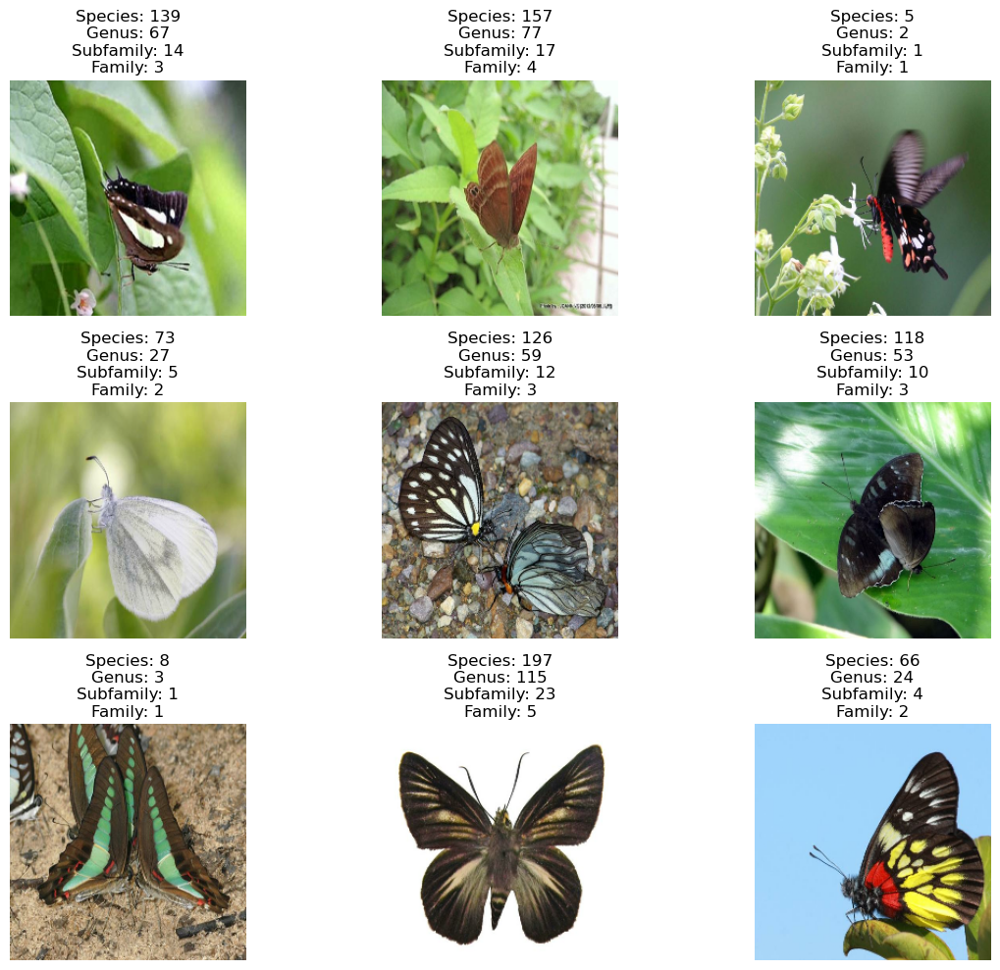

In [5]:
import matplotlib.pyplot as plt

def display_single_images(dataset, num_images=9):
    # Fetch a single batch from the dataset
    for images, labels in dataset.take(1):
        plt.figure(figsize=(12, 10))
        for i in range(min(num_images, images.shape[0])):
            ax = plt.subplot(3, 3, i + 1)
            image = images[i].numpy()
            image = (image - image.min()) / (image.max() - image.min())
            plt.imshow(image)
            # Extract each label from the dictionary
            family_label = labels['family_output'][i].numpy()
            subfamily_label = labels['subfamily_output'][i].numpy()
            genus_label = labels['genus_output'][i].numpy()
            species_label = labels['species_output'][i].numpy()
            plt.title(f"Species: {species_label}\nGenus: {genus_label}\nSubfamily: {subfamily_label}\nFamily: {family_label}")
            plt.axis("off")
        plt.tight_layout()  
        plt.show()

display_single_images(train_dataset_display, num_images=9)


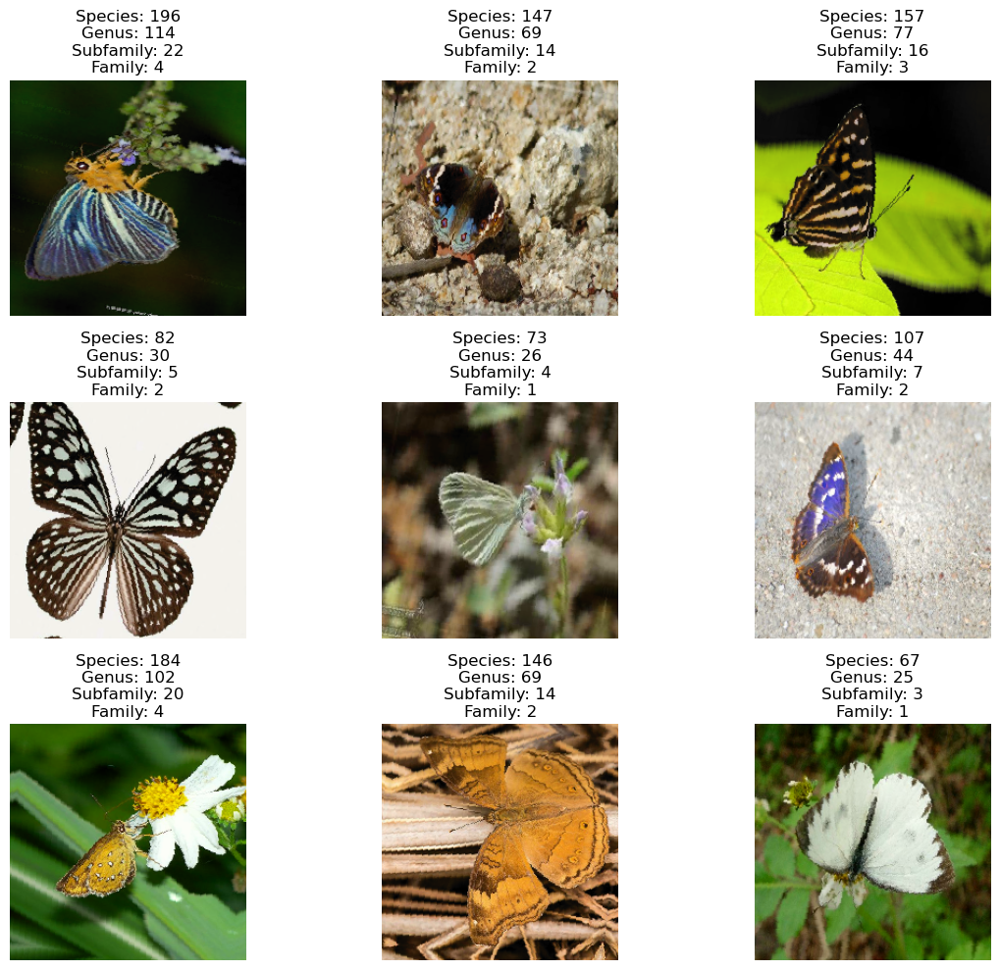

In [6]:
display_single_images(augmented_train_dataset, num_images=9)

In [ ]:
# Check unique labels in the dataset
def check_unique_labels(dataset):
    all_species_labels = []
    all_genus_labels = []
    all_subfamily_labels = []
    all_family_labels = []

    for _, labels in dataset.unbatch():
        all_species_labels.append(labels['species_output'].numpy())
        all_genus_labels.append(labels['genus_output'].numpy())
        all_subfamily_labels.append(labels['subfamily_output'].numpy())
        all_family_labels.append(labels['family_output'].numpy())

    print("Unique species labels:", np.unique(all_species_labels))
    print("Unique genus labels:", np.unique(all_genus_labels))
    print("Unique subfamily labels:", np.unique(all_subfamily_labels))
    print("Unique family labels:", np.unique(all_family_labels))

check_unique_labels(train_dataset)

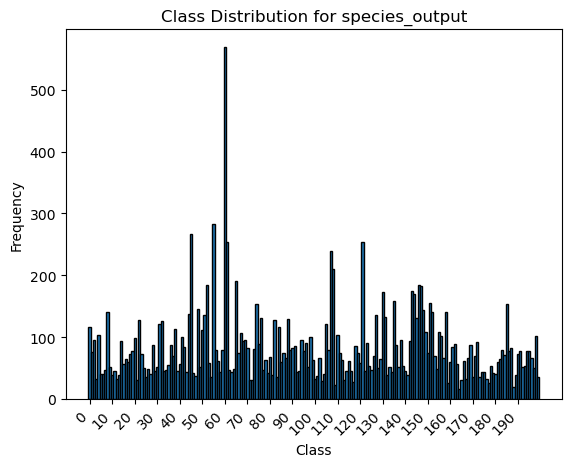

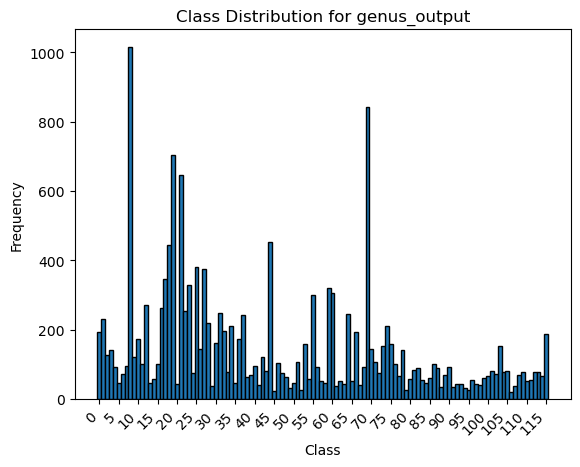

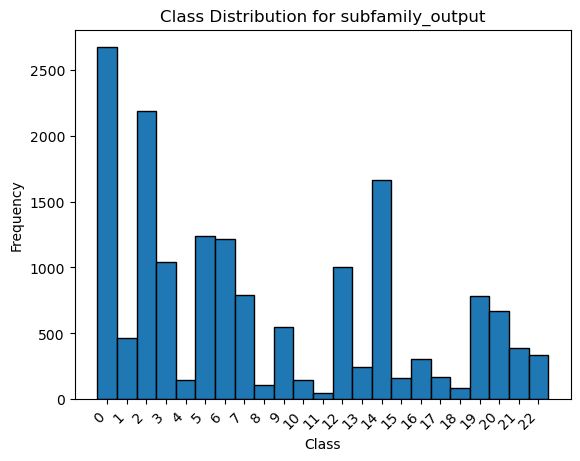

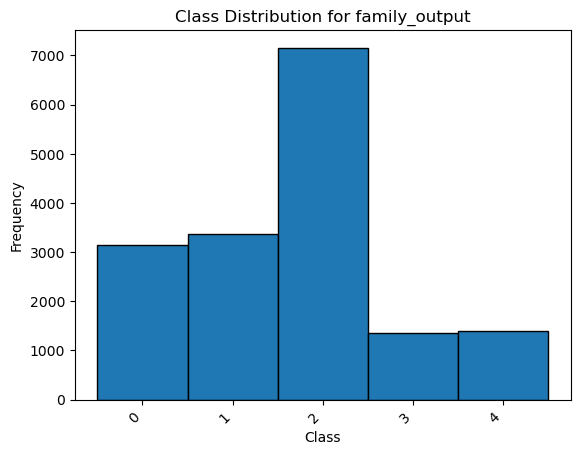

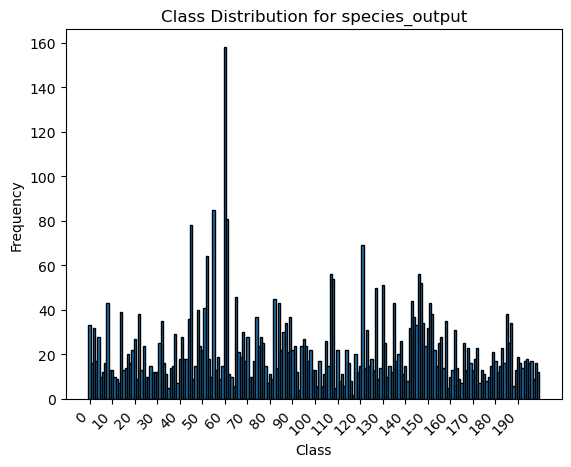

...

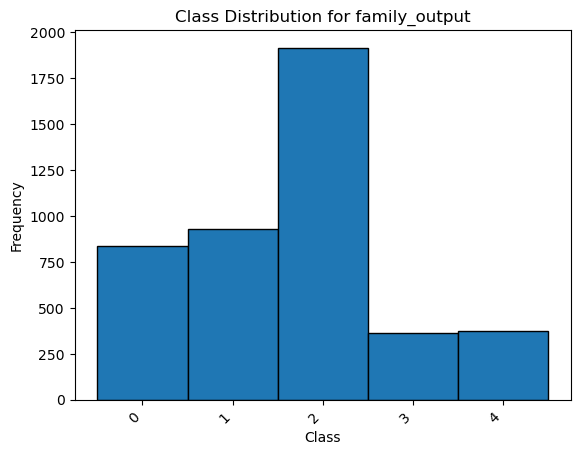

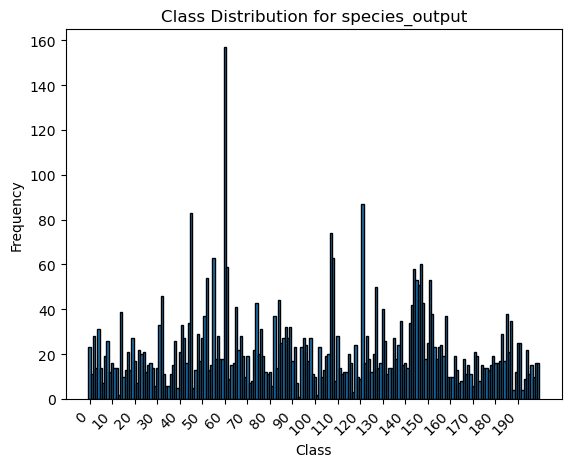

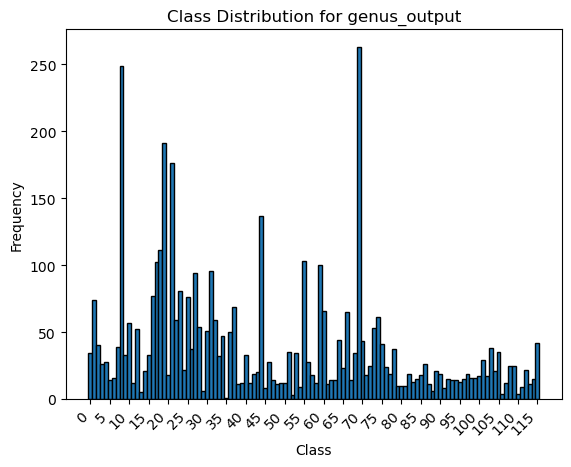

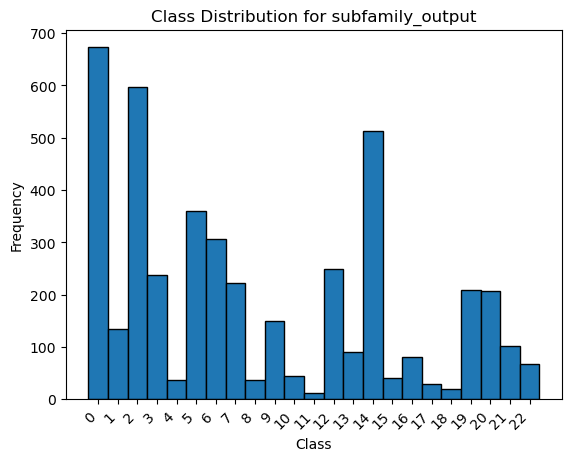

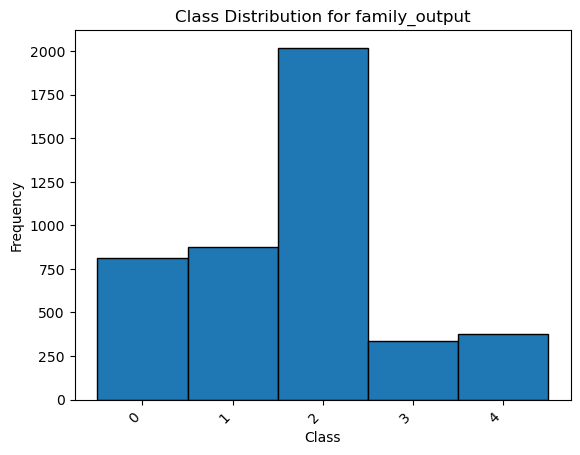

In [8]:
import matplotlib.pyplot as plt
import numpy as np

# Check class distribution in the dataset
def plot_class_distribution(dataset, label_name, num_classes):
    labels = []
    for images, label in dataset:
        labels.extend(label[label_name].numpy())
    plt.hist(labels, bins=np.arange(num_classes + 1) - 0.5, edgecolor='black')
    plt.xticks(np.arange(0, num_classes, step=max(1, num_classes // 20)), rotation=45, ha='right', fontsize=10)  # Adjust xticks for better readability
    plt.title(f"Class Distribution for {label_name}")
    plt.xlabel("Class")
    plt.ylabel("Frequency")
    plt.show()

# Assuming label names are 'species_output', 'genus_output', 'subfamily_output', 'family_output'
plot_class_distribution(train_dataset, 'species_output', num_classes=200)
plot_class_distribution(train_dataset, 'genus_output', num_classes=116)
plot_class_distribution(train_dataset, 'subfamily_output', num_classes=23)
plot_class_distribution(train_dataset, 'family_output', num_classes=5)

plot_class_distribution(test_dataset, 'species_output', num_classes=200)
plot_class_distribution(test_dataset, 'genus_output', num_classes=116)
plot_class_distribution(test_dataset, 'subfamily_output', num_classes=23)
plot_class_distribution(test_dataset, 'family_output', num_classes=5)

plot_class_distribution(val_dataset, 'species_output', num_classes=200)
plot_class_distribution(val_dataset, 'genus_output', num_classes=116)
plot_class_distribution(val_dataset, 'subfamily_output', num_classes=23)
plot_class_distribution(val_dataset, 'family_output', num_classes=5)


In [13]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from sklearn.utils.class_weight import compute_class_weight

# Define the multitask model with EfficientNetB0
def build_multitask_model_with_efficientnet(input_shape, num_species, num_genera, num_subfamilies, num_families):
    inputs = Input(shape=input_shape)

    # EfficientNetB0 base model
    base_model = EfficientNetB0(include_top=False, input_tensor=inputs, weights='imagenet')

    x = base_model.output

    # Add global average pooling
    x = GlobalAveragePooling2D()(x)
    x = Dropout(0.5)(x)

    # Output layers for each taxonomy level
    species_out = Dense(num_species, activation='softmax', name='species_output')(x)
    genus_out = Dense(num_genera, activation='softmax', name='genus_output')(x)
    subfamily_out = Dense(num_subfamilies, activation='softmax', name='subfamily_output')(x)
    family_out = Dense(num_families, activation='softmax', name='family_output')(x)

    # Model construction
    model = Model(inputs=inputs, outputs=[species_out, genus_out, subfamily_out, family_out])
    return model

# Example values for the number of classes in each taxonomy level
num_species = 200
num_genera = 116
num_subfamilies = 23
num_families = 5



# Assuming 'labels' is a list of lists containing the labels for each output
train_data_info = parse_data('Butterfly200_train_release.txt')
train_labels = [label for _, label in train_data_info]

# Separate the labels into different lists
species_labels = [label[0] for label in train_labels]
genus_labels = [label[1] for label in train_labels]
subfamily_labels = [label[2] for label in train_labels]
family_labels = [label[3] for label in train_labels]

# Compute class weights for each output
species_weights = compute_class_weight(class_weight='balanced', classes=np.unique(species_labels), y=species_labels)
genus_weights = compute_class_weight(class_weight='balanced', classes=np.unique(genus_labels), y=genus_labels)
subfamily_weights = compute_class_weight(class_weight='balanced', classes=np.unique(subfamily_labels), y=subfamily_labels)
family_weights = compute_class_weight(class_weight='balanced', classes=np.unique(family_labels), y=family_labels)

# Function to compute sample weights with TensorFlow operations
def compute_sample_weights_tf(label, class_weight_tensor):
    class_weights = tf.gather(class_weight_tensor, tf.cast(label, tf.int32))
    return class_weights

# Function to add sample weights
@tf.function
def add_sample_weights(image, label):
    species_weight = compute_sample_weights_tf(label['species_output'], tf.constant(species_weights, dtype=tf.float32))
    genus_weight = compute_sample_weights_tf(label['genus_output'], tf.constant(genus_weights, dtype=tf.float32))
    subfamily_weight = compute_sample_weights_tf(label['subfamily_output'], tf.constant(subfamily_weights, dtype=tf.float32))
    family_weight = compute_sample_weights_tf(label['family_output'], tf.constant(family_weights, dtype=tf.float32))

    # Combine weights (this example simply multiplies them, but you can adjust this as needed)
    combined_weight = species_weight * genus_weight * subfamily_weight * family_weight
    return image, label, combined_weight

# Apply sample weights
weighted_train_dataset = augmented_train_dataset.map(add_sample_weights, num_parallel_calls=tf.data.AUTOTUNE)


# Build the multitask model
model = build_multitask_model_with_efficientnet(
    input_shape=(224, 224, 3), 
    num_species=num_species, 
    num_genera=num_genera, 
    num_subfamilies=num_subfamilies, 
    num_families=num_families)

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), 
              loss=['sparse_categorical_crossentropy', 'sparse_categorical_crossentropy', 'sparse_categorical_crossentropy', 'sparse_categorical_crossentropy'],
              loss_weights=[1.0, 0.5, 0.3, 0.2], 
              metrics=['accuracy', 'accuracy', 'accuracy', 'accuracy'], jit_compile = False)

print(model.summary())


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_4         │ (None, 224, 224,  │          0 │ input_layer_2[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization_2     │ (None, 224, 224,  │          7 │ rescaling_4[0][0] │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_5         │ (None, 224, 224,  │          0 │ normalization_2[… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_5[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        512 │ block1a_se_excit

 Total params: 4,490,235 (17.13 MB)

 Trainable params: 4,448,212 (16.97 MB)

 Non-trainable params: 42,023 (164.16 KB)

None


In [6]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# Early stopping for each output with more stringent criteria
early_stopping_species = EarlyStopping(monitor='val_species_output_accuracy', min_delta=0.0001, patience=12, verbose=1, mode='max', restore_best_weights=True)
early_stopping_genus = EarlyStopping(monitor='val_genus_output_accuracy', min_delta=0.0001, patience=12, verbose=1, mode='max', restore_best_weights=True)
early_stopping_subfamily = EarlyStopping(monitor='val_subfamily_output_accuracy', min_delta=0.0001, patience=12, verbose=1, mode='max', restore_best_weights=True)
early_stopping_family = EarlyStopping(monitor='val_family_output_accuracy', min_delta=0.0001, patience=12, verbose=1, mode='max', restore_best_weights=True)

from tensorflow.keras.callbacks import ModelCheckpoint

# Define the ModelCheckpoint callback
checkpoint_callback = ModelCheckpoint(
    filepath='model_epoch_{epoch:02d}.keras',  # Save a new file for each epoch
    save_weights_only=False,  # Save the whole model
    save_freq='epoch',  # Save after every epoch
    verbose=1  # Verbosity mode, 0 or 1
)
# Reduce learning rate on plateau callback
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1)


# Combine the ModelCheckpoint callback with other callbacks
callbacks = [
    early_stopping_species,
    early_stopping_genus,
    early_stopping_subfamily,
    early_stopping_family,
    checkpoint_callback,
    reduce_lr
]

# Continue training the loaded model
history = model.fit(
    weighted_train_dataset,
    epochs=20,  # Continue for more epochs as needed
    validation_data=val_dataset,
    callbacks=callbacks
)



Epoch 1/20
513/513 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - family_output_accuracy: 0.1776 - genus_output_accuracy: 0.0165 - loss: 22.0373 - species_output_accuracy: 0.0142 - subfamily_output_accuracy: 0.0638
Epoch 1: saving model to model_epoch_01.keras
513/513 ━━━━━━━━━━━━━━━━━━━━ 2313s 4s/step - family_output_accuracy: 0.1777 - genus_output_accuracy: 0.0166 - loss: 22.0306 - species_output_accuracy: 0.0143 - subfamily_output_accuracy: 0.0638 - val_family_output_accuracy: 0.3028 - val_genus_output_accuracy: 0.0417 - val_loss: 9.1176 - val_species_output_accuracy: 0.0403 - val_subfamily_output_accuracy: 0.0926 - learning_rate: 1.0000e-04
Epoch 2/20
513/513 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - family_output_accuracy: 0.3576 - genus_output_accuracy: 0.0973 - loss: 10.4104 - species_output_accuracy: 0.0886 - subfamily_output_accuracy: 0.1670
Epoch 2: saving model to model_epoch_02.keras
513/513 ━━━━━━━━━━━━━━━━━━━━ 2298s 4s/step - family_output_accuracy: 0.3577 - genus_output_accuracy: 0.0974 - lo

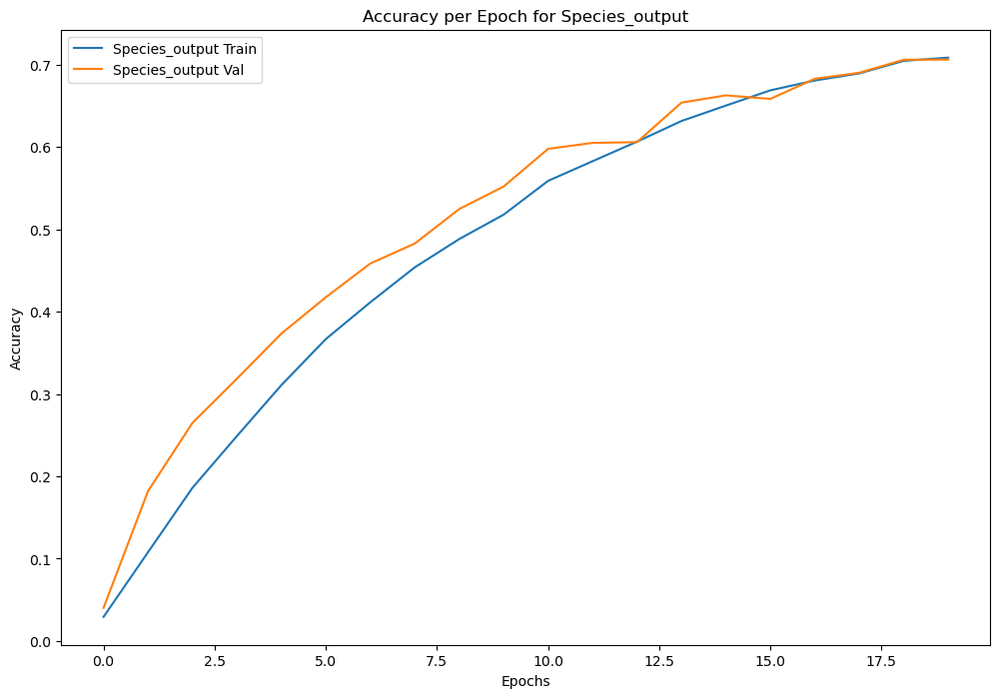

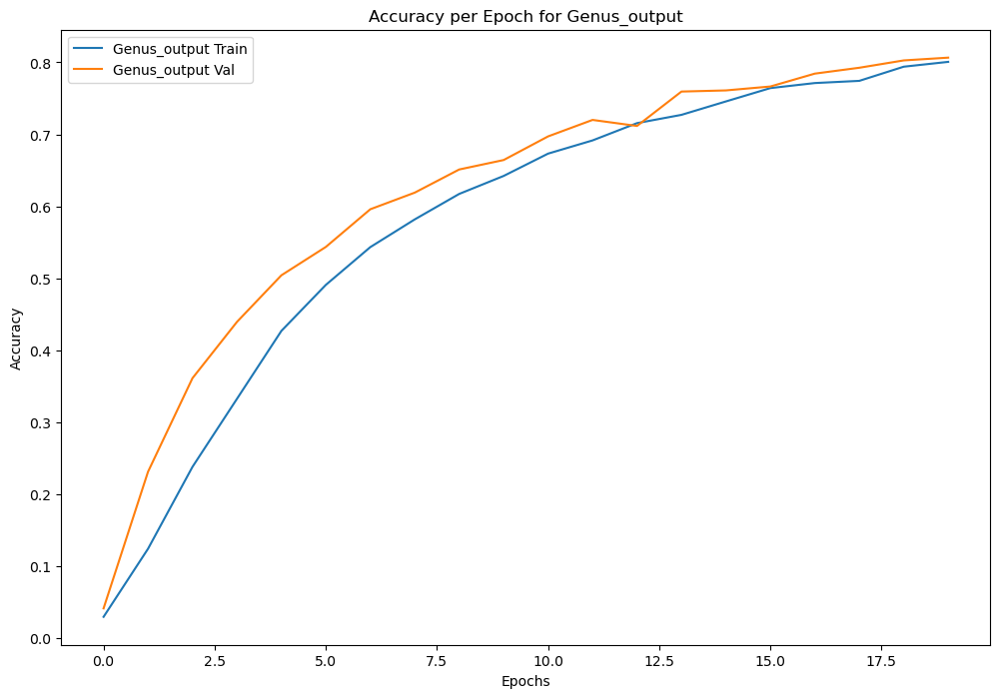

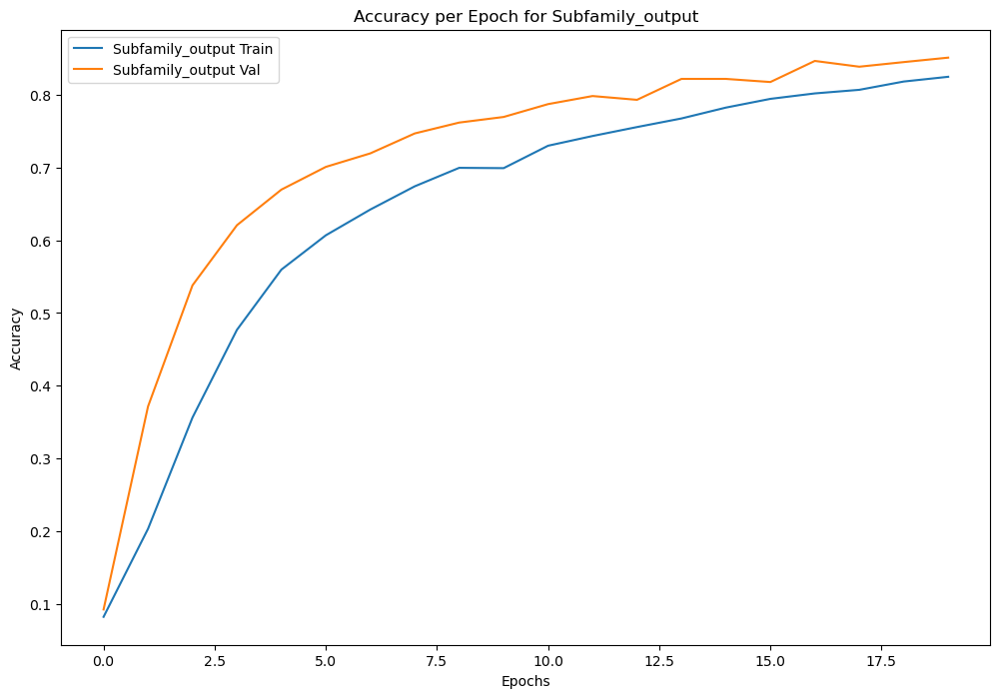

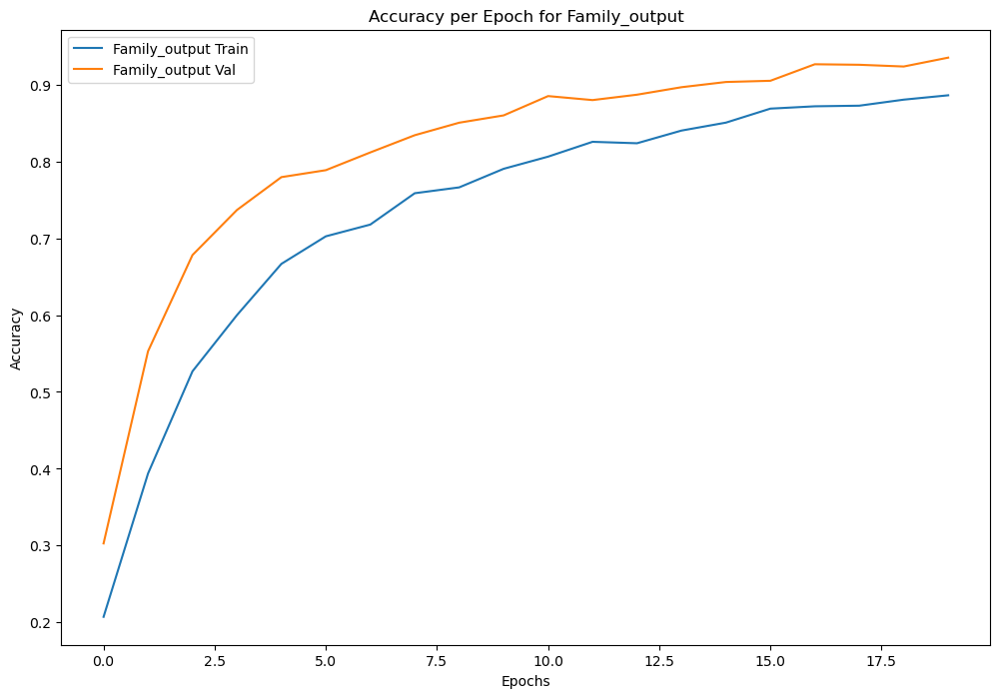

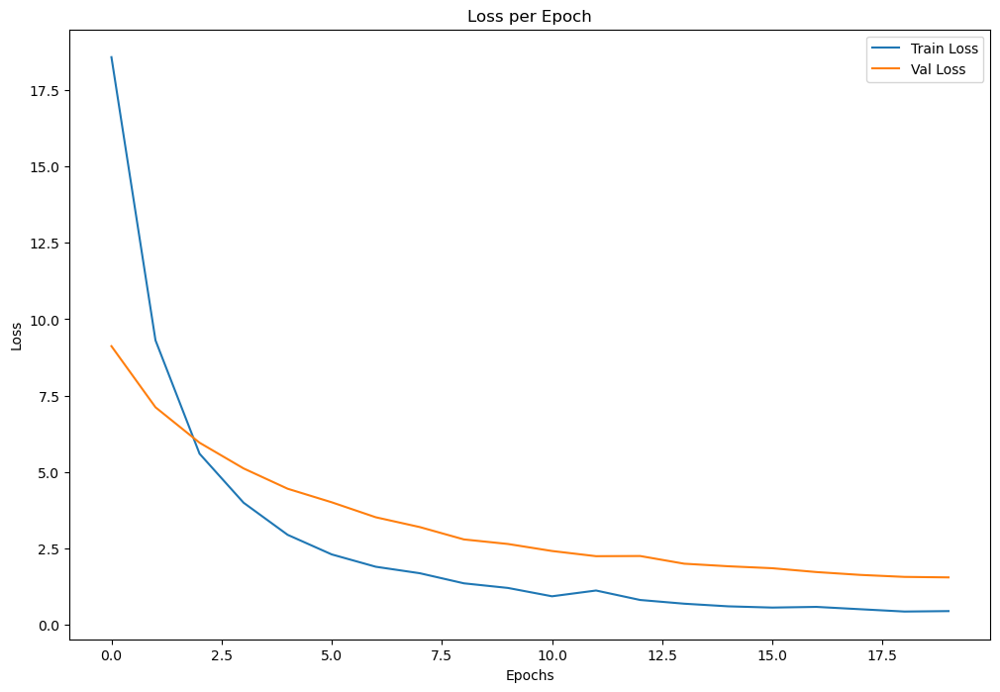

In [7]:
import matplotlib.pyplot as plt

def plot_individual_metrics(history, output, metric, title):
    plt.figure(figsize=(12, 8))
    train_metric = f'{output}_{metric}'
    val_metric = f'val_{output}_{metric}'
    
    if train_metric in history.history and val_metric in history.history:
        plt.plot(history.history[train_metric], label=f'{output.capitalize()} Train')
        plt.plot(history.history[val_metric], label=f'{output.capitalize()} Val')
        plt.title(f'{title} per Epoch for {output.capitalize()}')
        plt.xlabel('Epochs')
        plt.ylabel(metric.capitalize())
        plt.legend()
        plt.show()
    else:
        print(f"Metrics {train_metric} and {val_metric} are not available in history")

# Plot accuracy for each output
plot_individual_metrics(history, 'species_output', 'accuracy', 'Accuracy')
plot_individual_metrics(history, 'genus_output', 'accuracy', 'Accuracy')
plot_individual_metrics(history, 'subfamily_output', 'accuracy', 'Accuracy')
plot_individual_metrics(history, 'family_output', 'accuracy', 'Accuracy')

# Plot loss (using general 'loss' and 'val_loss' keys)
plt.figure(figsize=(12, 8))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Loss per Epoch')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


Classification Report for species_output:
              precision    recall  f1-score   support

           0       0.79      0.94      0.86       117
           1       0.57      0.93      0.71        76
           2       0.71      0.48      0.57        95
           3       0.46      0.64      0.53        33
           4       0.68      0.43      0.52       103
           5       0.95      0.95      0.95        41
           6       0.97      0.93      0.95        40
           7       0.81      1.00      0.90        47
           8       0.94      0.96      0.95       141
           9       0.83      0.77      0.80        52
          10       0.60      0.92      0.73        38
          11       0.47      1.00      0.64        46
          12       0.89      1.00      0.94        33
          13       0.80      1.00      0.89        39
          14       0.27      0.94      0.42        94
          15       0.85      0.20      0.32        56
          16       0.58      0.49      

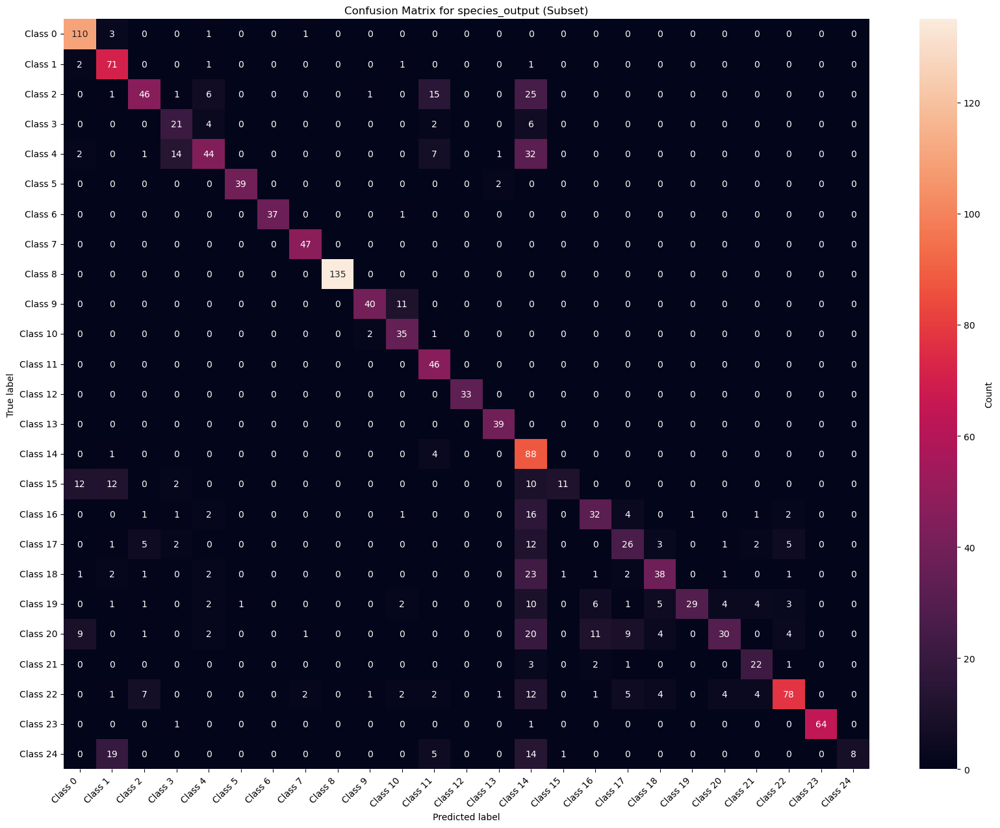

Classification Report for species_output:
              precision    recall  f1-score   support

           0       0.78      0.85      0.81        33
           1       0.39      0.88      0.54        16
           2       0.69      0.34      0.46        32
           3       0.38      0.35      0.36        17
           4       0.37      0.25      0.30        28
           5       0.80      0.89      0.84         9
           6       0.92      0.92      0.92        12
           7       0.88      0.88      0.88        16
           8       0.95      0.98      0.97        43
           9       0.70      0.54      0.61        13
          10       0.55      0.92      0.69        13
          11       0.38      1.00      0.56        10
          12       0.89      0.89      0.89         9
          13       0.50      0.71      0.59         7
          14       0.30      0.87      0.44        39
          15       0.50      0.15      0.24        13
          16       0.46      0.43      

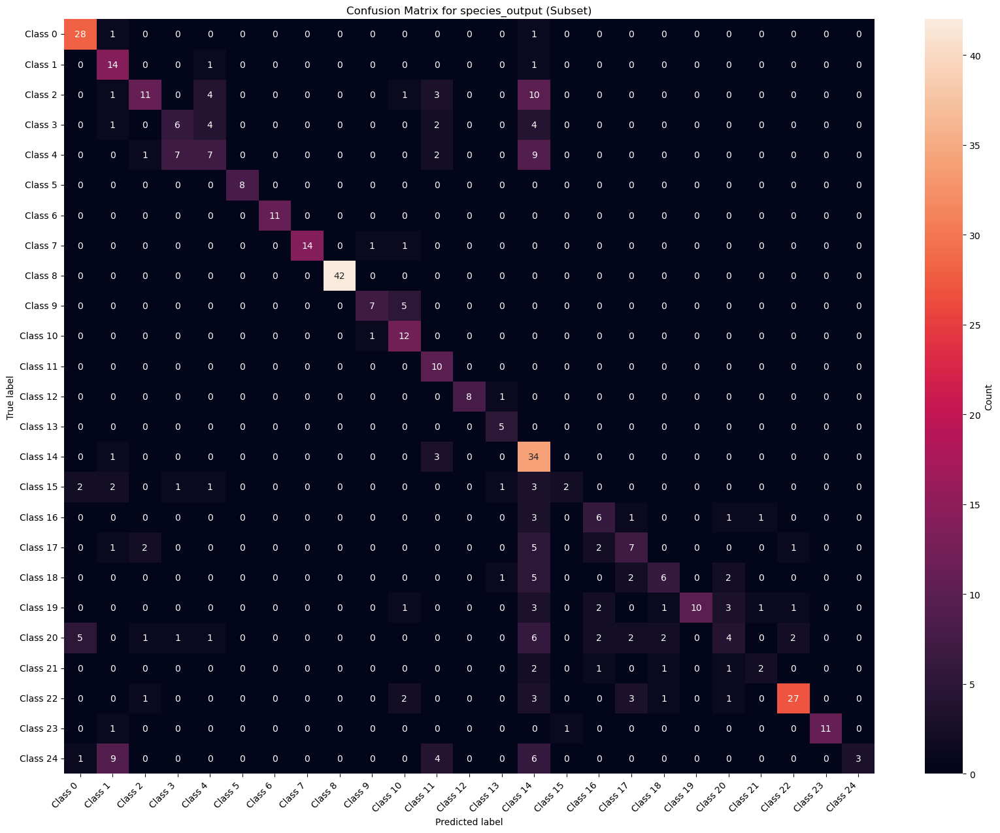

Classification Report for genus_output:
              precision    recall  f1-score   support

           0       0.69      0.94      0.79       193
           1       0.85      0.77      0.80       230
           2       0.86      0.93      0.89       128
           3       0.96      0.94      0.95       141
           4       0.83      1.00      0.91        91
           5       0.50      1.00      0.67        46
           6       0.86      0.99      0.92        72
           7       0.40      0.89      0.55        94
           8       0.98      0.70      0.82      1016
           9       0.99      0.87      0.93       121
          10       0.90      0.94      0.92       172
          11       0.94      0.99      0.97       102
          12       0.95      0.97      0.96       270
          13       0.98      1.00      0.99        45
          14       0.98      1.00      0.99        57
          15       0.92      1.00      0.96       101
          16       0.98      0.98      0.

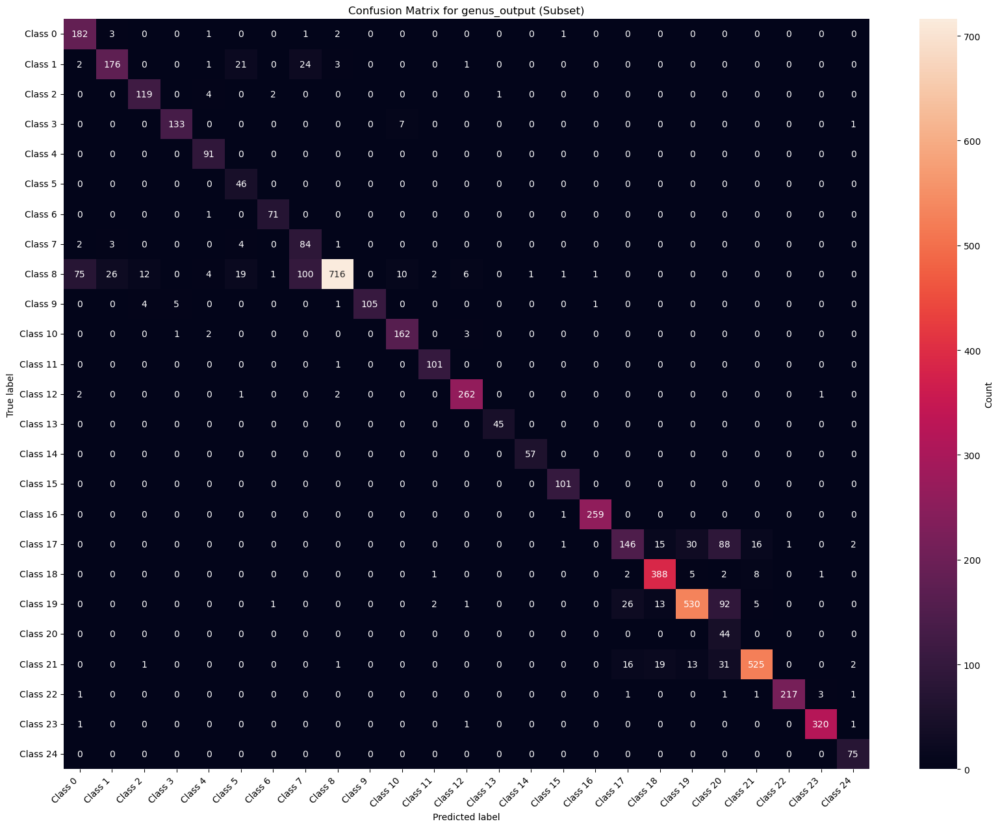

Classification Report for genus_output:
              precision    recall  f1-score   support

           0       0.61      0.92      0.73        49
           1       0.76      0.71      0.74        77
           2       0.86      0.84      0.85        38
           3       0.97      0.90      0.94        42
           4       0.83      0.96      0.89        26
           5       0.37      1.00      0.54        10
           6       0.78      0.88      0.82        16
           7       0.52      0.87      0.65        39
           8       0.99      0.68      0.81       268
           9       1.00      0.92      0.96        25
          10       0.90      0.90      0.90        51
          11       1.00      0.88      0.93        16
          12       0.85      0.91      0.88        58
          13       1.00      1.00      1.00         7
          14       0.90      1.00      0.95        18
          15       0.87      0.93      0.90        28
          16       1.00      0.97      0.

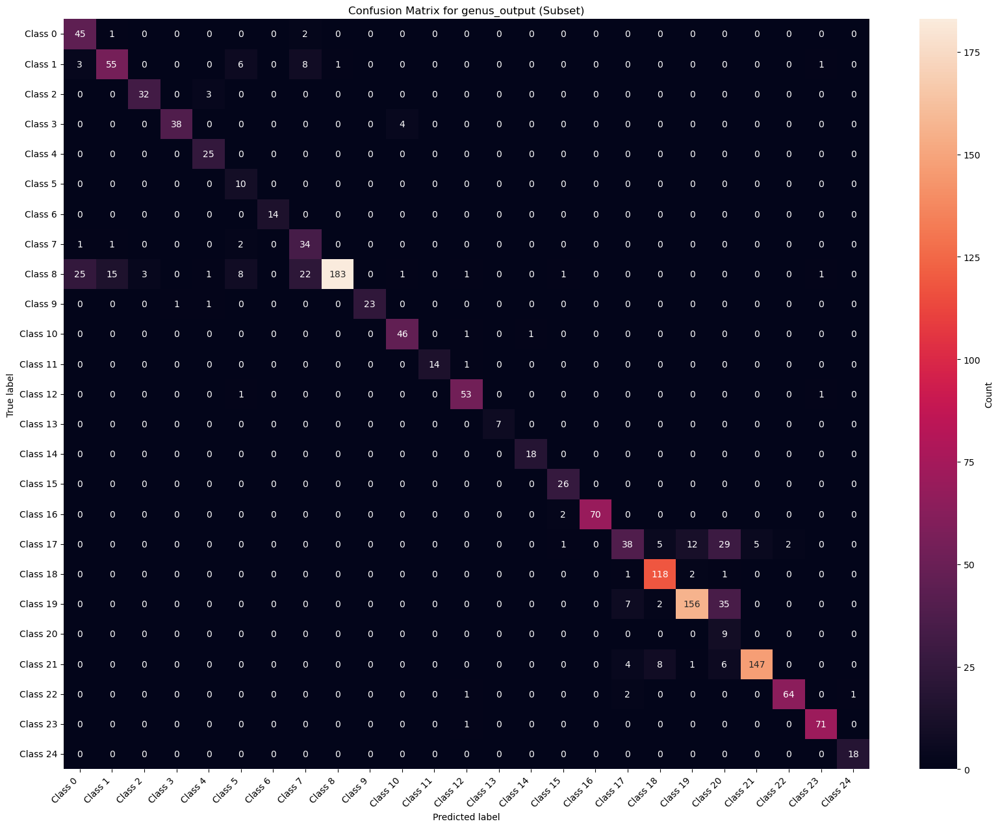

Classification Report for subfamily_output:
              precision    recall  f1-score   support

           0       0.98      0.96      0.97      2673
           1       0.95      0.99      0.97       467
           2       0.99      0.91      0.95      2182
           3       0.90      0.86      0.88      1039
           4       0.65      1.00      0.79       143
           5       0.84      0.97      0.90      1237
           6       0.74      0.91      0.82      1220
           7       0.85      0.74      0.79       794
           8       0.59      1.00      0.74       106
           9       0.85      0.94      0.89       545
          10       0.88      1.00      0.94       143
          11       0.76      1.00      0.86        47
          12       0.81      0.75      0.78      1003
          13       0.81      0.99      0.89       244
          14       0.93      0.38      0.54      1665
          15       0.61      0.98      0.75       158
          16       0.74      1.00    

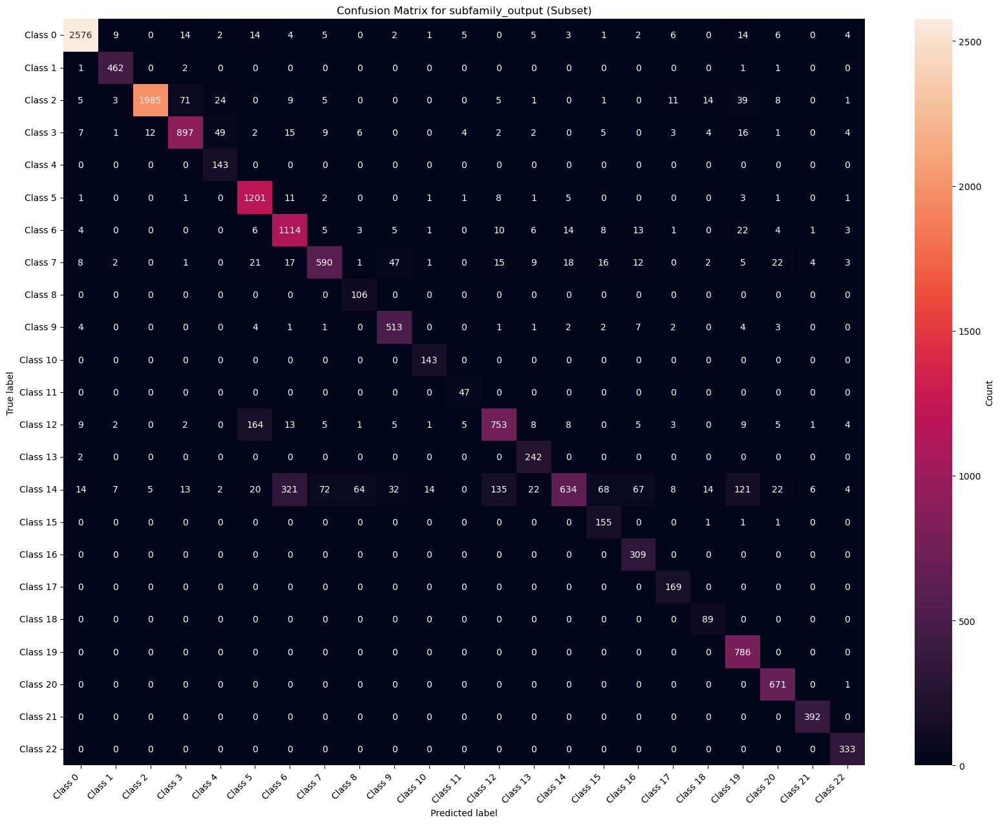

Classification Report for subfamily_output:
              precision    recall  f1-score   support

           0       0.96      0.95      0.95       715
           1       0.92      0.94      0.93       125
           2       0.99      0.94      0.97       620
           3       0.90      0.83      0.86       269
           4       0.58      1.00      0.73        36
           5       0.86      0.97      0.92       366
           6       0.74      0.89      0.81       321
           7       0.85      0.78      0.81       184
           8       0.45      1.00      0.62        24
           9       0.80      0.90      0.85       132
          10       0.86      0.96      0.91        46
          11       0.82      1.00      0.90        18
          12       0.80      0.73      0.76       261
          13       0.86      0.94      0.90        71
          14       0.92      0.39      0.54       455
          15       0.55      0.93      0.69        40
          16       0.70      1.00    

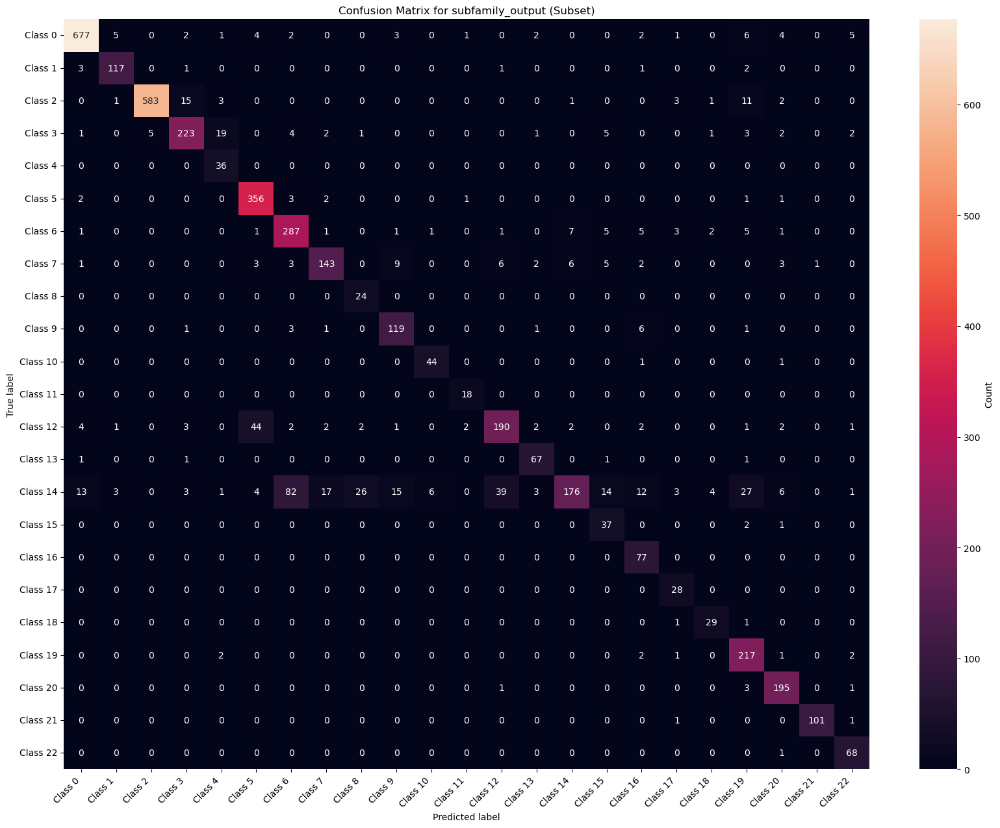

Classification Report for family_output:
              precision    recall  f1-score   support

           0       0.97      0.95      0.96      3141
           1       0.98      0.91      0.94      3363
           2       0.97      0.95      0.96      7166
           3       0.79      1.00      0.88      1350
           4       0.92      1.00      0.96      1396

    accuracy                           0.95     16416
   macro avg       0.93      0.96      0.94     16416
weighted avg       0.95      0.95      0.95     16416



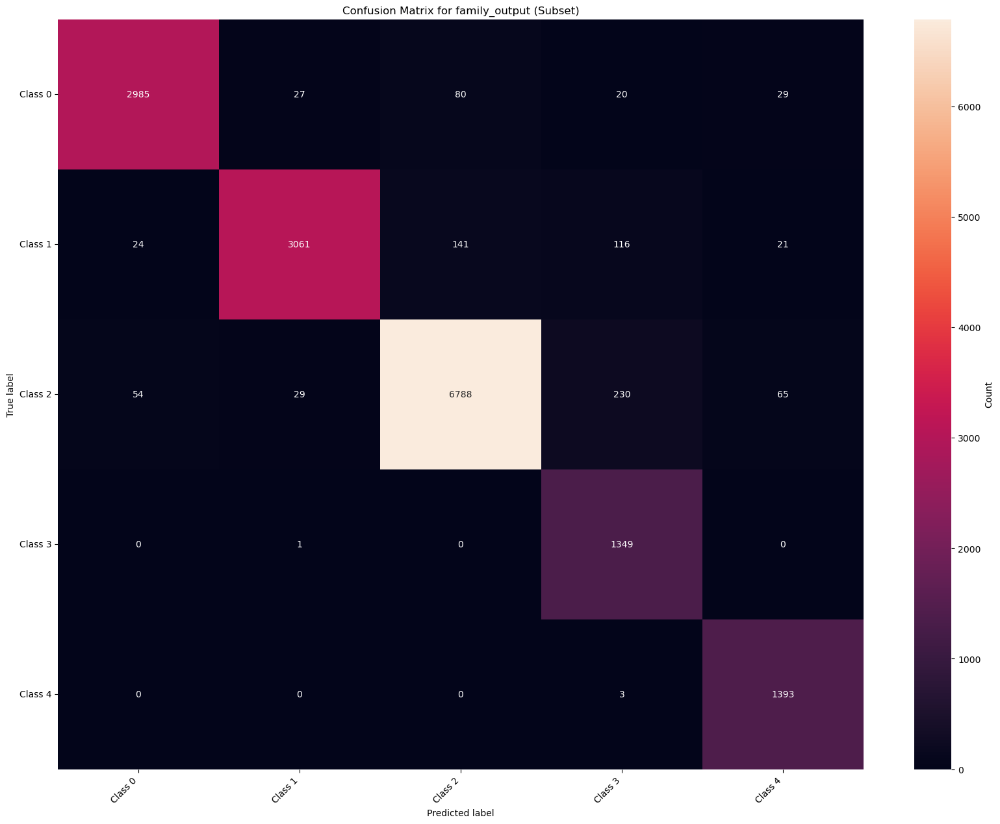

Classification Report for family_output:
              precision    recall  f1-score   support

           0       0.97      0.95      0.96       841
           1       0.98      0.92      0.95       925
           2       0.96      0.95      0.95      1916
           3       0.76      0.96      0.85       360
           4       0.91      0.98      0.94       374

    accuracy                           0.94      4416
   macro avg       0.92      0.95      0.93      4416
weighted avg       0.95      0.94      0.94      4416



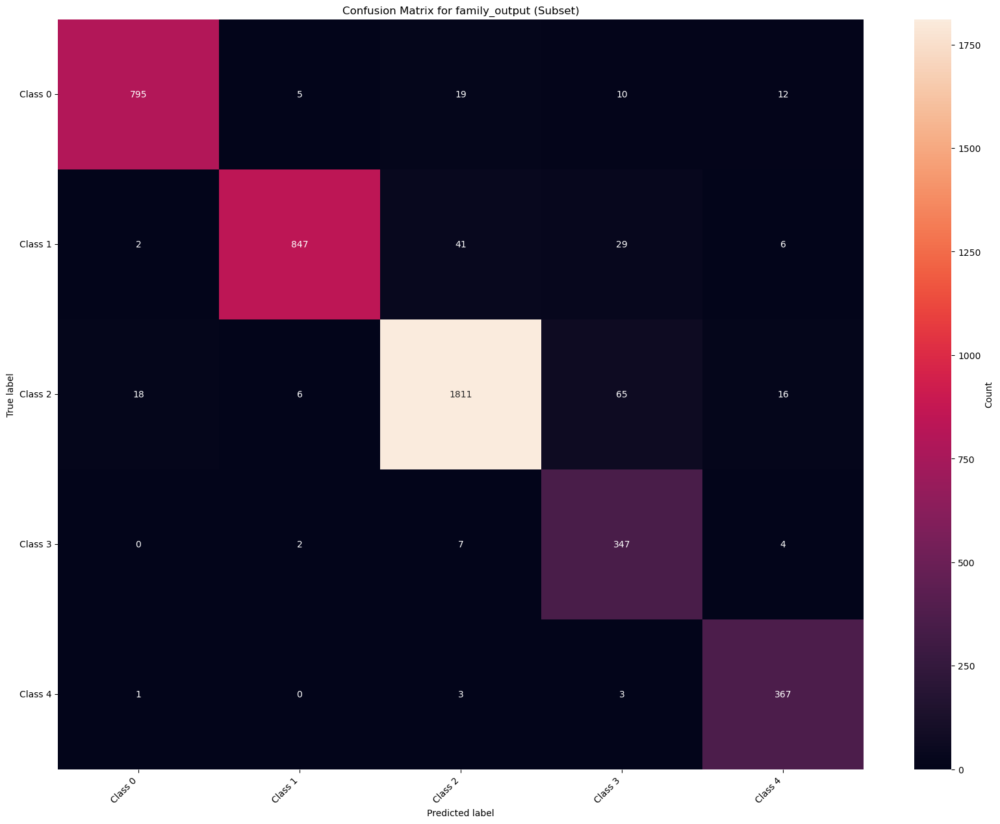

In [9]:
import os
import tensorflow as tf
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Suppress TensorFlow warnings and info messages
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # Suppress all messages
tf.get_logger().setLevel('ERROR')

def plot_confusion_matrix(y_true, y_pred, classes, title):
    cm = confusion_matrix(y_true, y_pred)
    if len(classes) > 25:
        classes = classes[:25]  # Display only first 25 classes if there are more than 25
        cm = cm[:25, :25]  # Confine confusion matrix to first 25 classes
    plt.figure(figsize=(20, 15))
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=classes, yticklabels=classes, cbar_kws={'label': 'Count'})
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.show()

def evaluate_model(model, dataset, output_name, num_classes, subset=25):
    y_true = []
    y_pred = []
    
    for images, labels in dataset:
        preds = model.predict(images, verbose=0)  # Suppress output
        output_index = ['species_output', 'genus_output', 'subfamily_output', 'family_output'].index(output_name)
        true_labels = labels[output_name].numpy()
        predicted_labels = np.argmax(preds[output_index], axis=1)
        
        y_true.extend(true_labels)
        y_pred.extend(predicted_labels)
    
    print(f"Classification Report for {output_name}:")
    print(classification_report(y_true, y_pred))
    
    classes = [f'Class {i}' for i in range(num_classes)]
    plot_confusion_matrix(y_true, y_pred, classes, f'Confusion Matrix for {output_name} (Subset)')

# Example: Evaluate species_output, genus_output, subfamily_output, family_output

evaluate_model(model, train_dataset, 'species_output', num_classes=200, subset=25)
evaluate_model(model, test_dataset, 'species_output', num_classes=200, subset=25)
evaluate_model(model, train_dataset, 'genus_output', num_classes=116, subset=25)
evaluate_model(model, test_dataset, 'genus_output', num_classes=116, subset=25)
evaluate_model(model, train_dataset, 'subfamily_output', num_classes=23, subset=23)
evaluate_model(model, test_dataset, 'subfamily_output', num_classes=23, subset=23)
evaluate_model(model, train_dataset, 'family_output', num_classes=5, subset=5)
evaluate_model(model, test_dataset, 'family_output', num_classes=5, subset=5)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 609ms/step


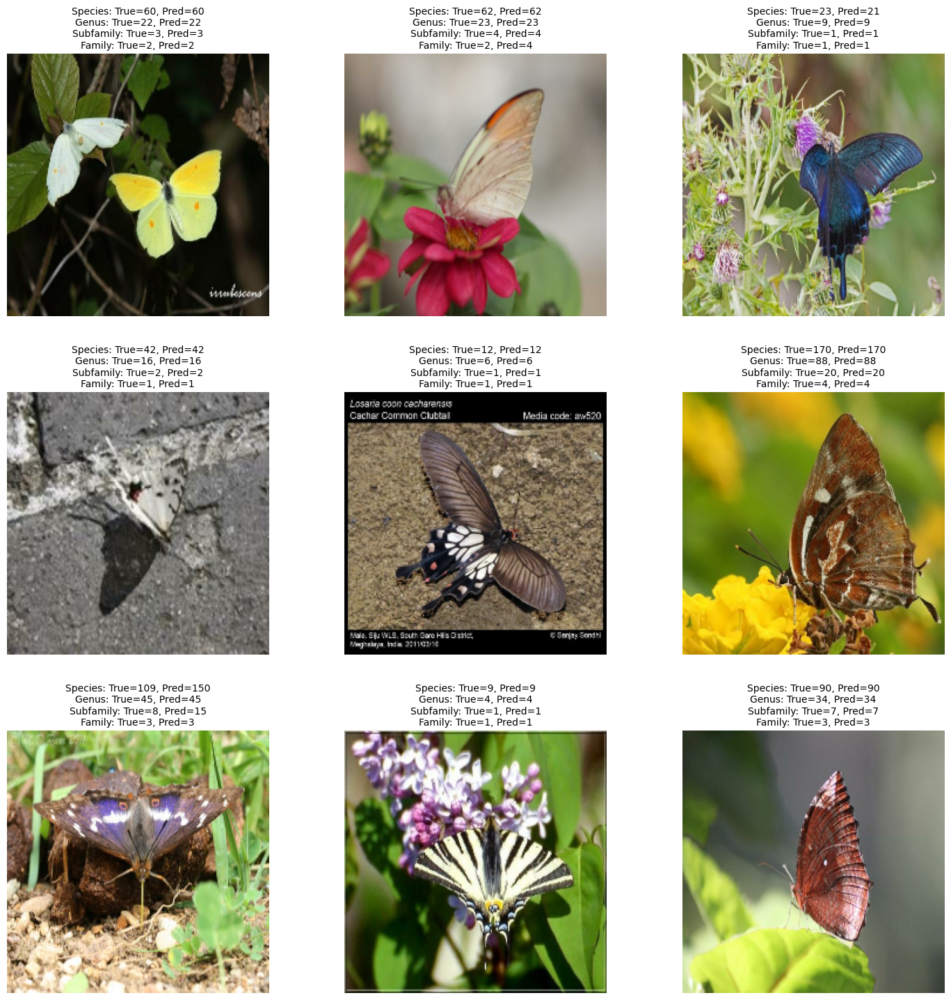

In [17]:
import numpy as np
import matplotlib.pyplot as plt

def visualize_predictions(model, dataset):
    plt.figure(figsize=(15, 15))
    
    for images, labels in dataset.take(1):
        preds = model.predict(images)
        
        true_species = labels['species_output'].numpy() + 1
        true_genus = labels['genus_output'].numpy() + 1
        true_subfamily = labels['subfamily_output'].numpy() + 1
        true_family = labels['family_output'].numpy() + 1
        
        pred_species = np.argmax(preds[0], axis=1) + 1
        pred_genus = np.argmax(preds[1], axis=1) + 1
        pred_subfamily = np.argmax(preds[2], axis=1) + 1
        pred_family = np.argmax(preds[3], axis=1) + 1
        
        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].numpy())
            plt.title(
                f"Species: True={true_species[i]}, Pred={pred_species[i]}\n"
                f"Genus: True={true_genus[i]}, Pred={pred_genus[i]}\n"
                f"Subfamily: True={true_subfamily[i]}, Pred={pred_subfamily[i]}\n"
                f"Family: True={true_family[i]}, Pred={pred_family[i]}",
                fontsize=10
            )
            plt.axis("off")
    
    plt.tight_layout(pad=3.0)
    plt.show()

visualize_predictions(model, test_dataset)


In [6]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model


model = load_model('model_epoch_20.keras')
import numpy as np
import tensorflow as tf


# Function to calculate top-n accuracy
def top_n_accuracy(y_true, y_pred_probs, n=1):
    top_n_preds = np.argsort(y_pred_probs, axis=1)[:, -n:]
    correct = np.any(top_n_preds == y_true.reshape(-1, 1), axis=1)
    return np.mean(correct)

# Load the test dataset (assuming `test_dataset` is already defined)
y_true_species = []
y_true_genus = []
y_true_subfamily = []
y_true_family = []
y_pred_species = []
y_pred_genus = []
y_pred_subfamily = []
y_pred_family = []

for images, labels in test_dataset:
    y_true_species.extend(labels['species_output'].numpy())
    y_true_genus.extend(labels['genus_output'].numpy())
    y_true_subfamily.extend(labels['subfamily_output'].numpy())
    y_true_family.extend(labels['family_output'].numpy())
    
    preds = model.predict(images)
    y_pred_species.extend(preds[0])
    y_pred_genus.extend(preds[1])
    y_pred_subfamily.extend(preds[2])
    y_pred_family.extend(preds[3])

# Convert lists to numpy arrays
y_true_species = np.array(y_true_species)
y_true_genus = np.array(y_true_genus)
y_true_subfamily = np.array(y_true_subfamily)
y_true_family = np.array(y_true_family)
y_pred_species = np.array(y_pred_species)
y_pred_genus = np.array(y_pred_genus)
y_pred_subfamily = np.array(y_pred_subfamily)
y_pred_family = np.array(y_pred_family)

# Calculate top-1 and top-5 accuracies for each output
species_top_1_acc = top_n_accuracy(y_true_species, y_pred_species, n=1)
species_top_5_acc = top_n_accuracy(y_true_species, y_pred_species, n=5)
genus_top_1_acc = top_n_accuracy(y_true_genus, y_pred_genus, n=1)
genus_top_5_acc = top_n_accuracy(y_true_genus, y_pred_genus, n=5)
subfamily_top_1_acc = top_n_accuracy(y_true_subfamily, y_pred_subfamily, n=1)
subfamily_top_5_acc = top_n_accuracy(y_true_subfamily, y_pred_subfamily, n=5)
family_top_1_acc = top_n_accuracy(y_true_family, y_pred_family, n=1)
family_top_5_acc = top_n_accuracy(y_true_family, y_pred_family, n=5)

print(f"Test Species Top-1 Accuracy: {species_top_1_acc:.4f}")
print(f"Test Species Top-5 Accuracy: {species_top_5_acc:.4f}")
print(f"Test Genus Top-1 Accuracy: {genus_top_1_acc:.4f}")
print(f"Test Genus Top-5 Accuracy: {genus_top_5_acc:.4f}")
print(f"Test Subfamily Top-1 Accuracy: {subfamily_top_1_acc:.4f}")
print(f"Test Subfamily Top-5 Accuracy: {subfamily_top_5_acc:.4f}")
print(f"Test Family Top-1 Accuracy: {family_top_1_acc:.4f}")
print(f"Test Family Top-5 Accuracy: {family_top_5_acc:.4f}")



1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 994ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 991ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 993ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 992ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 995ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 994ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 773ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 765ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 688ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 691ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 765ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 685ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 684ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 772ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 769ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 766ms/step
1/1 ━━━━━━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 698ms/step


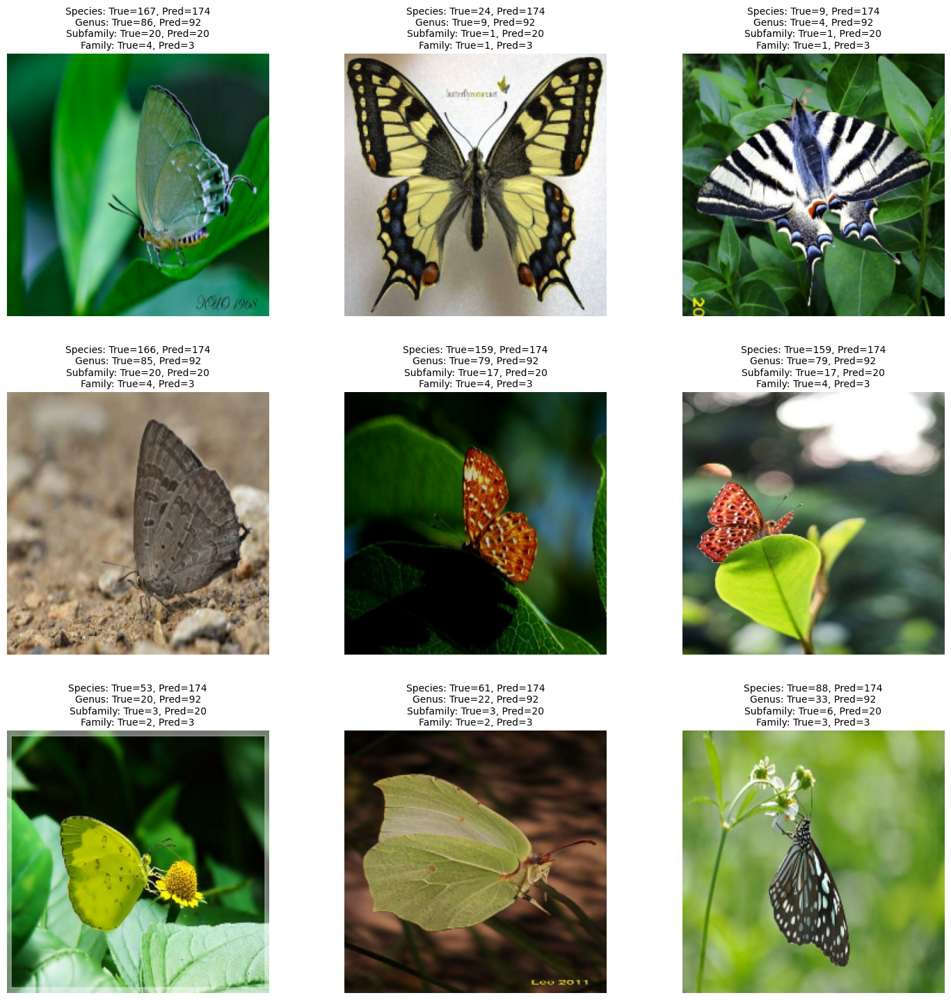

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

def collect_misclassified_examples(model, dataset, num_examples=9):
    misclassified_images = []
    
    for images, labels in dataset:
        preds = model.predict(images)
        true_species = labels['species_output'].numpy()
        true_genus = labels['genus_output'].numpy()
        true_subfamily = labels['subfamily_output'].numpy()
        true_family = labels['family_output'].numpy()
        
        pred_species = np.argmax(preds[0], axis=1)
        pred_genus = np.argmax(preds[1], axis=1)
        pred_subfamily = np.argmax(preds[2], axis=1)
        pred_family = np.argmax(preds[3], axis=1)
        
        # Adjust indices to be 1-based
        true_species += 1
        true_genus += 1
        true_subfamily += 1
        true_family += 1

        pred_species += 1
        pred_genus += 1
        pred_subfamily += 1
        pred_family += 1
        
        # Identify misclassified examples
        for i in range(len(images)):
            if (true_species[i] != pred_species[i] or 
                true_genus[i] != pred_genus[i] or 
                true_subfamily[i] != pred_subfamily[i] or 
                true_family[i] != pred_family[i]):
                if len(misclassified_images) < num_examples:
                    misclassified_images.append((
                        images[i].numpy(), 
                        (true_species[i], pred_species[i]), 
                        (true_genus[i], pred_genus[i]), 
                        (true_subfamily[i], pred_subfamily[i]), 
                        (true_family[i], pred_family[i])
                    ))
                else:
                    break
        
        if len(misclassified_images) >= num_examples:
            break

    return misclassified_images

def plot_misclassified_examples(misclassified_images):
    plt.figure(figsize=(15, 15))
    for i, (image, species, genus, subfamily, family) in enumerate(misclassified_images):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(image)
        plt.title(
            f"Species: True={species[0]}, Pred={species[1]}\n"
            f"Genus: True={genus[0]}, Pred={genus[1]}\n"
            f"Subfamily: True={subfamily[0]}, Pred={subfamily[1]}\n"
            f"Family: True={family[0]}, Pred={family[1]}",
            fontsize=10
        )
        plt.axis("off")
    plt.tight_layout(pad=3.0)
    plt.show()

# Collect and plot misclassified examples for the dataset
misclassified_examples = collect_misclassified_examples(model, test_dataset)
plot_misclassified_examples(misclassified_examples)


In [ ]:
# Save the entire model in the new Keras format
model.save('path_to_my_model.keras')


In [9]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Layer, GlobalAveragePooling2D, GlobalMaxPooling2D, Reshape, Dense, Multiply, Permute, Concatenate, Conv2D, Add, Activation, Dropout, Input
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau


class CBAM(Layer):
    def __init__(self, reduction_ratio=8, **kwargs):
        super(CBAM, self).__init__(**kwargs)
        self.reduction_ratio = reduction_ratio

    def build(self, input_shape):
        self.channel = input_shape[-1]
        self.shared_dense = Dense(self.channel // self.reduction_ratio, activation='relu')
        self.channel_attention = Dense(self.channel, activation='sigmoid')
        self.conv = Conv2D(1, (7, 7), padding='same', activation='sigmoid')

    def call(self, inputs):
        # Channel Attention Module
        avg_pool = GlobalAveragePooling2D()(inputs)
        avg_pool = Reshape((1, 1, self.channel))(avg_pool)
        avg_pool = self.shared_dense(avg_pool)
        avg_pool = self.channel_attention(avg_pool)
        
        max_pool = GlobalMaxPooling2D()(inputs)
        max_pool = Reshape((1, 1, self.channel))(max_pool)
        max_pool = self.shared_dense(max_pool)
        max_pool = self.channel_attention(max_pool)
        
        channel_attention_output = Add()([avg_pool, max_pool])
        channel_attention_output = Multiply()([inputs, channel_attention_output])
        
        # Spatial Attention Module
        avg_pool = tf.reduce_mean(channel_attention_output, axis=-1, keepdims=True)
        max_pool = tf.reduce_max(channel_attention_output, axis=-1, keepdims=True)
        concat = tf.concat([avg_pool, max_pool], axis=-1)
        spatial_attention = self.conv(concat)
        
        spatial_attention_output = Multiply()([channel_attention_output, spatial_attention])
        
        return spatial_attention_output

    def get_config(self):
        config = super(CBAM, self).get_config()
        config.update({
            "reduction_ratio": self.reduction_ratio
        })
        return config


In [10]:
from tensorflow.keras.applications import EfficientNetB0

def build_multitask_model_with_cbam_efficientnet(input_shape, num_species, num_genera, num_subfamilies, num_families, unfreeze_from=100):
    inputs = Input(shape=input_shape)

    # Load EfficientNetB0 base model
    base_model = EfficientNetB0(include_top=False, input_tensor=inputs, weights='imagenet')
    
    # Unfreeze layers from the 'unfreeze_from' layer
    for layer in base_model.layers[unfreeze_from:]:
        layer.trainable = True

    # Get the output of the base model
    x = base_model.output

    # Add CBAM block after the base model
    x = CBAM()(x)

    # Add global average pooling
    x = GlobalAveragePooling2D()(x)
    x = Dropout(0.5)(x)

    # Output layers for each taxonomy level
    species_out = Dense(num_species, activation='softmax', name='species_output')(x)
    genus_out = Dense(num_genera, activation='softmax', name='genus_output')(x)
    subfamily_out = Dense(num_subfamilies, activation='softmax', name='subfamily_output')(x)
    family_out = Dense(num_families, activation='softmax', name='family_output')(x)

    # Model construction
    model = Model(inputs=inputs, outputs=[species_out, genus_out, subfamily_out, family_out])
    
    return model

# Example values for the number of classes in each taxonomy level
num_species = 200
num_genera = 116
num_subfamilies = 23
num_families = 5

# Build the multitask model
model_with_cbam = build_multitask_model_with_cbam_efficientnet(
    input_shape=(224, 224, 3), 
    num_species=num_species, 
    num_genera=num_genera, 
    num_subfamilies=num_subfamilies, 
    num_families=num_families,
    unfreeze_from=100  # Adjust this number based on your needs
)

# Compile the model with a slightly higher learning rate
model_with_cbam.compile(optimizer=Adam(learning_rate=0.0001), 
              loss=['sparse_categorical_crossentropy', 'sparse_categorical_crossentropy', 'sparse_categorical_crossentropy', 'sparse_categorical_crossentropy'],
              loss_weights=[1.0, 0.5, 0.3, 0.2], 
              metrics=['accuracy', 'accuracy', 'accuracy', 'accuracy'])


# Print the model summary
print(model_with_cbam.summary())


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_2         │ (None, 224, 224,  │          0 │ input_layer_1[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization_1     │ (None, 224, 224,  │          7 │ rescaling_2[0][0] │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_3         │ (None, 224, 224,  │          0 │ normalization_1[… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_3[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        512 │ block1a_se_excit

 Total params: 4,901,374 (18.70 MB)

 Trainable params: 4,859,351 (18.54 MB)

 Non-trainable params: 42,023 (164.16 KB)

None


In [14]:
from tensorflow.keras.callbacks import EarlyStopping

# Early stopping for each output with more stringent criteria
early_stopping_species = EarlyStopping(monitor='val_species_output_accuracy', min_delta=0.0001, patience=12, verbose=1, mode='max', restore_best_weights=True)
early_stopping_genus = EarlyStopping(monitor='val_genus_output_accuracy', min_delta=0.0001, patience=12, verbose=1, mode='max', restore_best_weights=True)
early_stopping_subfamily = EarlyStopping(monitor='val_subfamily_output_accuracy', min_delta=0.0001, patience=12, verbose=1, mode='max', restore_best_weights=True)
early_stopping_family = EarlyStopping(monitor='val_family_output_accuracy', min_delta=0.0001, patience=12, verbose=1, mode='max', restore_best_weights=True)
# Learning rate scheduler with shorter patience
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-6, verbose=1)

# Define the ModelCheckpoint callback
checkpoint_callback = ModelCheckpoint(
    filepath='cbam_model_epoch_{epoch:02d}.keras',  # Save a new file for each epoch
    save_weights_only=False,  # Save the whole model
    save_freq='epoch',  # Save after every epoch
    verbose=1  # Verbosity mode, 0 or 1
)

# Combine callbacks
callbacks = [
    early_stopping_species,
    early_stopping_genus,
    early_stopping_subfamily,
    early_stopping_family,
    checkpoint_callback,
    reduce_lr
]

# Initial training
history = model_with_cbam.fit(
    weighted_train_dataset,
    epochs=20,
    validation_data=val_dataset,
    callbacks=callbacks
)


Epoch 1/20
513/513 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - family_output_accuracy: 0.2221 - genus_output_accuracy: 0.0173 - loss: 21.9433 - species_output_accuracy: 0.0139 - subfamily_output_accuracy: 0.0520
Epoch 1: saving model to cbam_model_epoch_01.keras
513/513 ━━━━━━━━━━━━━━━━━━━━ 2396s 5s/step - family_output_accuracy: 0.2222 - genus_output_accuracy: 0.0173 - loss: 21.9362 - species_output_accuracy: 0.0139 - subfamily_output_accuracy: 0.0521 - val_family_output_accuracy: 0.2699 - val_genus_output_accuracy: 0.0430 - val_loss: 9.3355 - val_species_output_accuracy: 0.0417 - val_subfamily_output_accuracy: 0.0971 - learning_rate: 1.0000e-04
Epoch 2/20
513/513 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - family_output_accuracy: 0.3750 - genus_output_accuracy: 0.1005 - loss: 10.0566 - species_output_accuracy: 0.0919 - subfamily_output_accuracy: 0.1668
Epoch 2: saving model to cbam_model_epoch_02.keras
513/513 ━━━━━━━━━━━━━━━━━━━━ 2344s 5s/step - family_output_accuracy: 0.3751 - genus_output_accuracy: 0

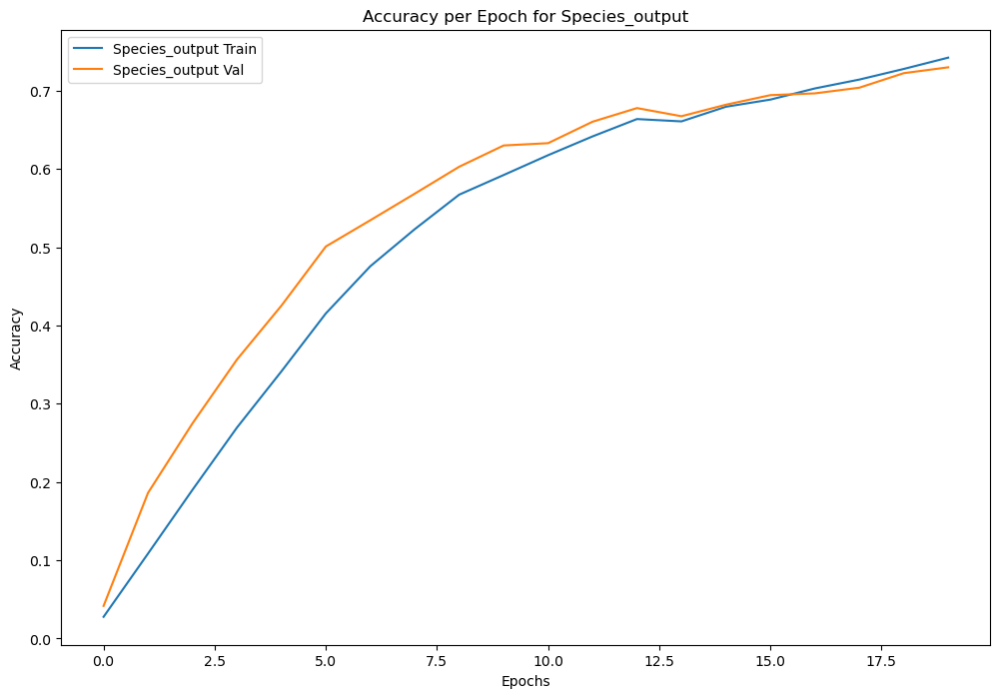

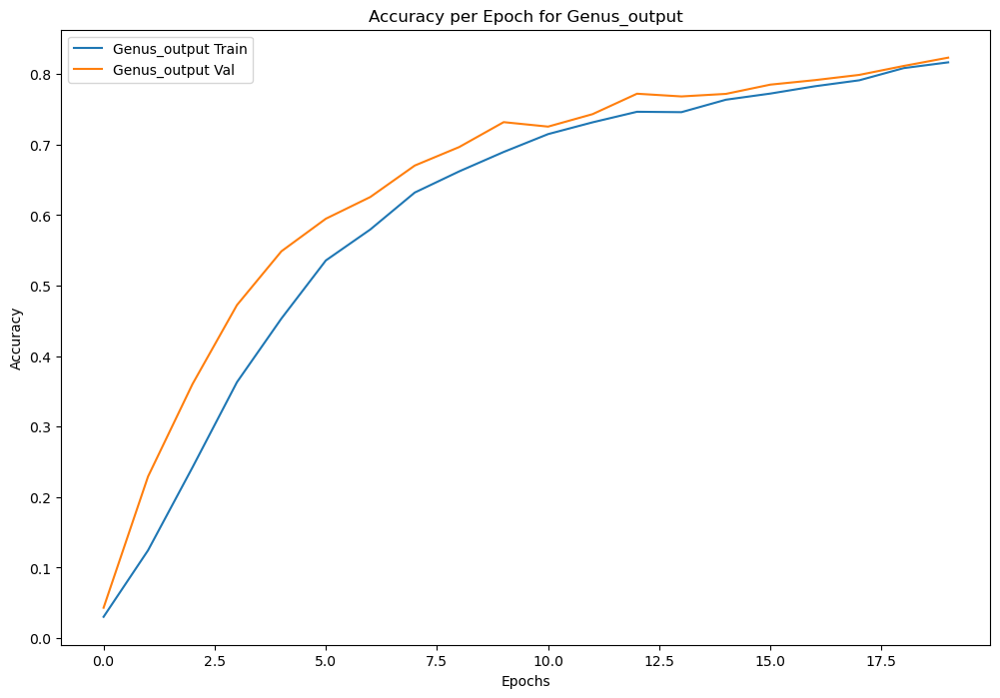

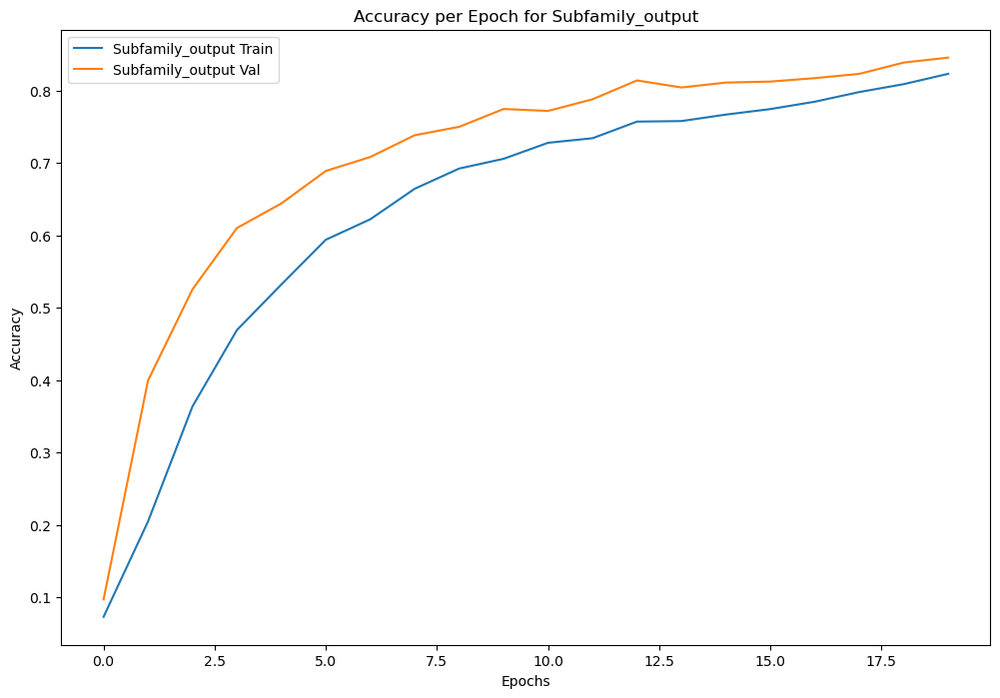

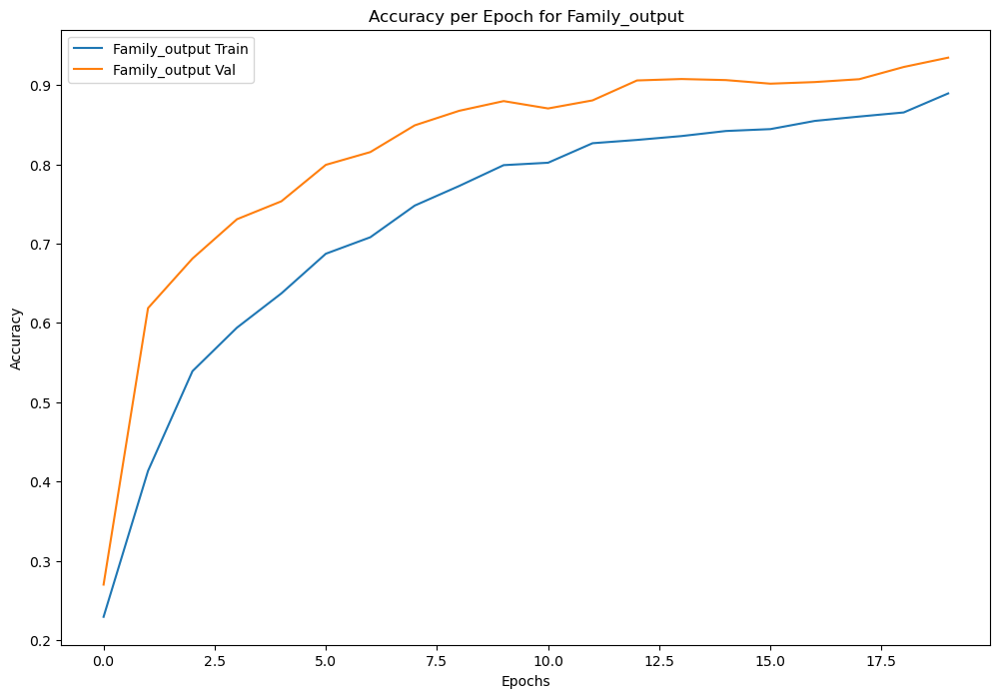

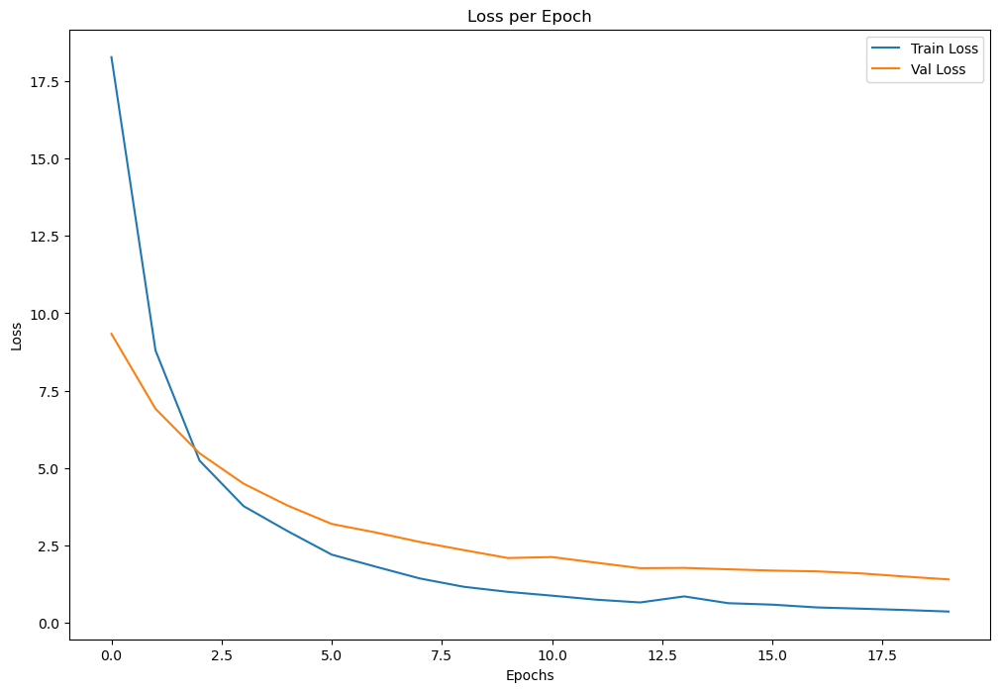

In [15]:
import matplotlib.pyplot as plt

def plot_individual_metrics(history, output, metric, title):
    plt.figure(figsize=(12, 8))
    train_metric = f'{output}_{metric}'
    val_metric = f'val_{output}_{metric}'
    
    if train_metric in history.history and val_metric in history.history:
        plt.plot(history.history[train_metric], label=f'{output.capitalize()} Train')
        plt.plot(history.history[val_metric], label=f'{output.capitalize()} Val')
        plt.title(f'{title} per Epoch for {output.capitalize()}')
        plt.xlabel('Epochs')
        plt.ylabel(metric.capitalize())
        plt.legend()
        plt.show()
    else:
        print(f"Metrics {train_metric} and {val_metric} are not available in history")

# Plot accuracy for each output
plot_individual_metrics(history, 'species_output', 'accuracy', 'Accuracy')
plot_individual_metrics(history, 'genus_output', 'accuracy', 'Accuracy')
plot_individual_metrics(history, 'subfamily_output', 'accuracy', 'Accuracy')
plot_individual_metrics(history, 'family_output', 'accuracy', 'Accuracy')

# Plot loss (using general 'loss' and 'val_loss' keys)
plt.figure(figsize=(12, 8))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Loss per Epoch')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


Classification Report for species_output:
              precision    recall  f1-score   support

           0       0.89      0.90      0.89       117
           1       0.55      0.99      0.71        76
           2       0.85      0.63      0.72        95
           3       0.53      0.79      0.63        33
           4       0.80      0.57      0.67       103
           5       0.95      0.98      0.96        41
           6       0.93      1.00      0.96        40
           7       0.96      1.00      0.98        47
           8       0.99      0.95      0.97       141
           9       0.78      0.94      0.85        52
          10       0.83      0.87      0.85        39
          11       0.46      1.00      0.63        46
          12       0.97      1.00      0.99        33
          13       0.80      1.00      0.89        39
          14       0.44      0.93      0.60        94
          15       0.93      0.50      0.65        56
          16       0.70      0.80      

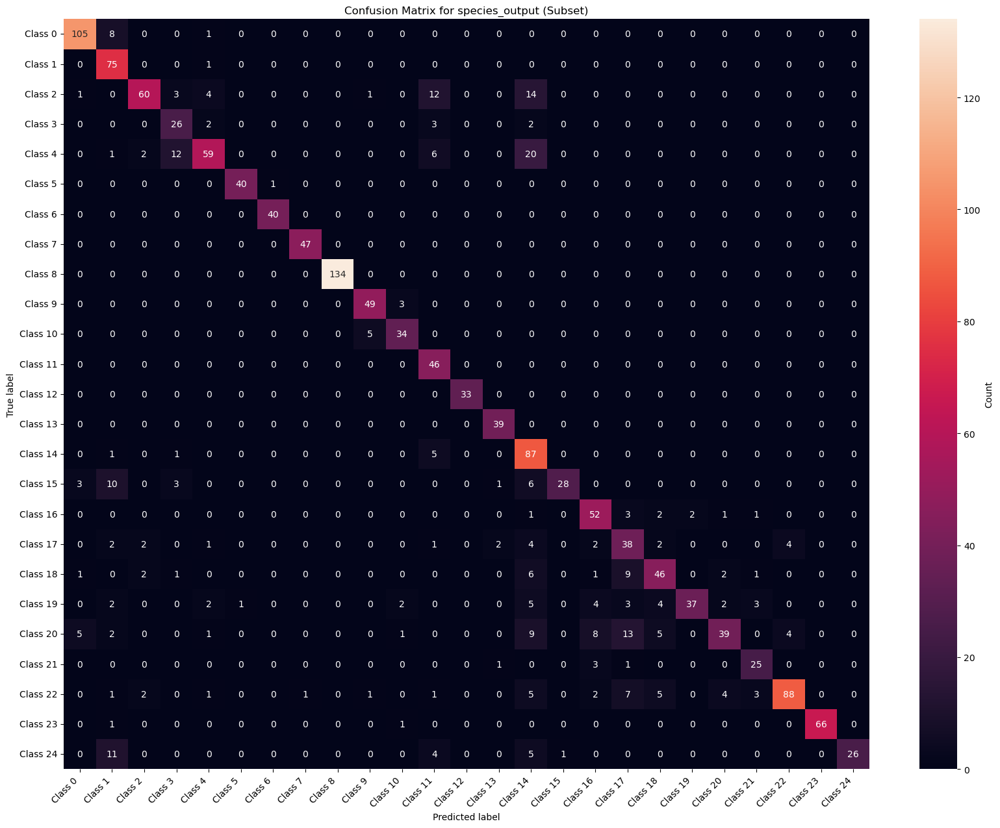

Classification Report for species_output:
              precision    recall  f1-score   support

           0       0.84      0.82      0.83        33
           1       0.50      0.94      0.65        16
           2       0.61      0.44      0.51        32
           3       0.59      0.59      0.59        17
           4       0.55      0.43      0.48        28
           5       1.00      0.90      0.95        10
           6       0.91      0.83      0.87        12
           7       0.87      0.81      0.84        16
           8       1.00      0.95      0.98        43
           9       0.77      0.77      0.77        13
          10       0.62      0.77      0.69        13
          11       0.31      1.00      0.48        10
          12       0.82      1.00      0.90         9
          13       0.60      0.86      0.71         7
          14       0.45      0.84      0.59        38
          15       0.62      0.38      0.48        13
          16       0.62      0.57      

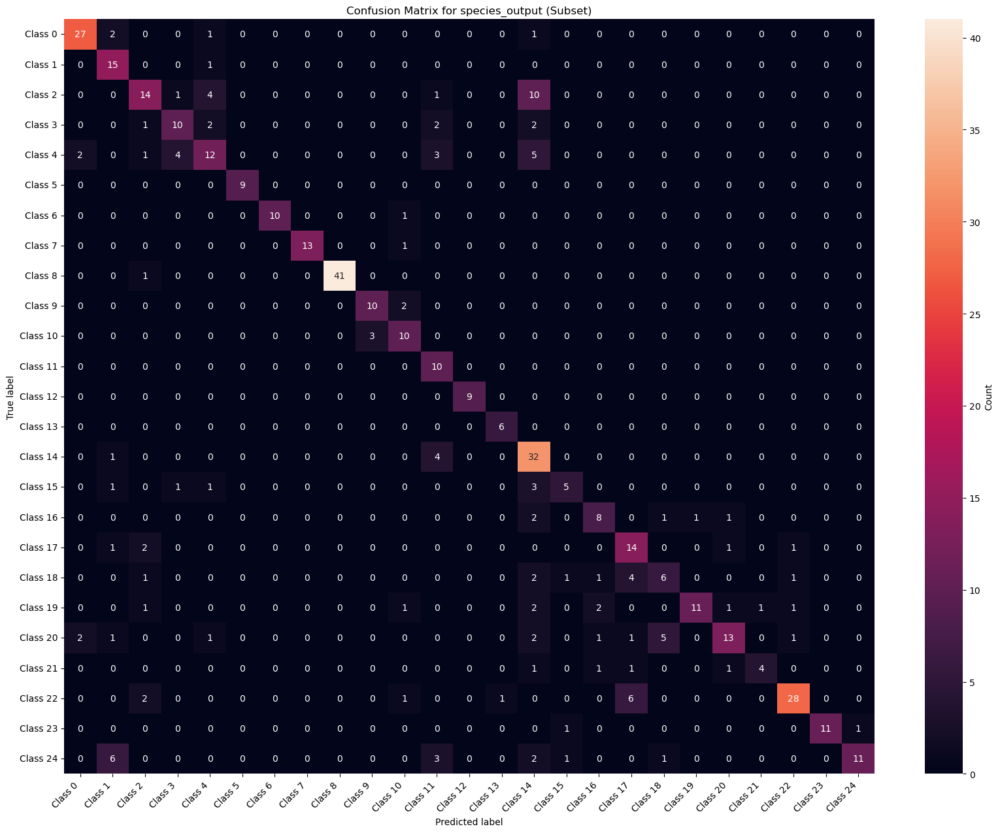

Classification Report for genus_output:
              precision    recall  f1-score   support

           0       0.57      0.88      0.69        49
           1       0.79      0.79      0.79        77
           2       0.87      0.87      0.87        38
           3       1.00      0.95      0.98        43
           4       0.86      0.96      0.91        26
           5       0.31      1.00      0.48        10
           6       0.83      0.94      0.88        16
           7       0.62      0.85      0.72        39
           8       0.99      0.69      0.82       267
           9       1.00      0.88      0.94        25
          10       0.94      0.86      0.90        51
          11       1.00      1.00      1.00        16
          12       0.92      0.93      0.92        58
          13       1.00      1.00      1.00         7
          14       0.89      0.94      0.92        18
          15       1.00      0.93      0.96        28
          16       0.99      0.99      0.

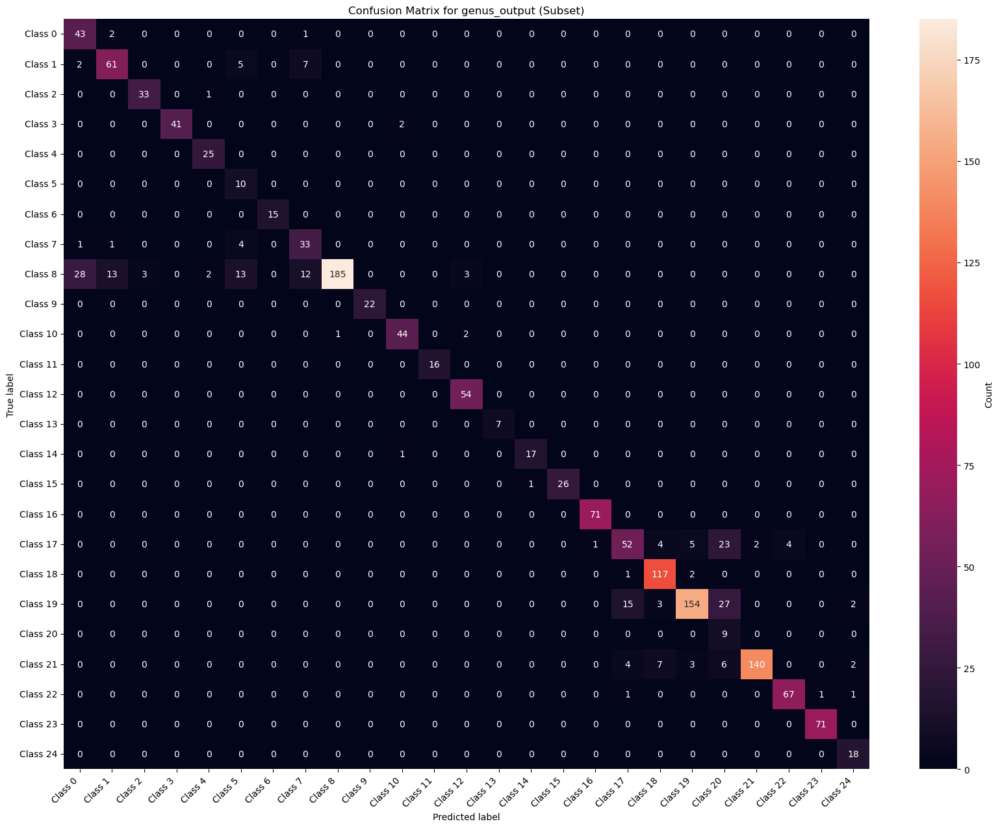

Classification Report for genus_output:
              precision    recall  f1-score   support

           0       0.68      0.94      0.79       193
           1       0.85      0.78      0.81       231
           2       0.87      0.98      0.92       128
           3       0.99      0.91      0.95       141
           4       0.89      1.00      0.94        91
           5       0.41      1.00      0.59        46
           6       0.86      1.00      0.92        72
           7       0.51      0.89      0.65        94
           8       0.98      0.73      0.84      1013
           9       0.99      0.90      0.94       121
          10       0.90      0.91      0.91       172
          11       0.96      1.00      0.98       102
          12       0.93      0.96      0.94       269
          13       0.94      1.00      0.97        45
          14       0.98      1.00      0.99        57
          15       0.99      0.99      0.99       101
          16       0.98      1.00      0.

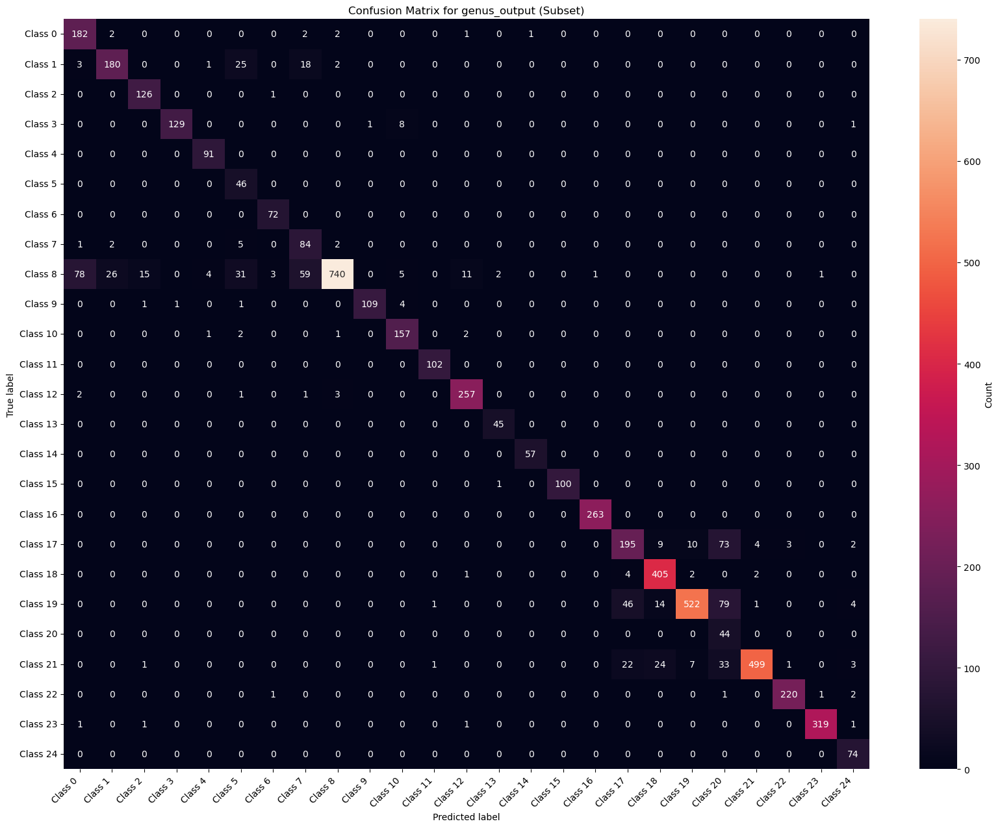

Classification Report for subfamily_output:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96       716
           1       0.92      0.95      0.93       125
           2       0.99      0.94      0.96       620
           3       0.89      0.81      0.85       270
           4       0.61      0.97      0.75        37
           5       0.91      0.97      0.94       364
           6       0.71      0.89      0.79       321
           7       0.75      0.85      0.80       183
           8       0.61      0.96      0.74        24
           9       0.83      0.90      0.87       132
          10       0.86      0.96      0.91        46
          11       0.60      1.00      0.75        18
          12       0.86      0.70      0.78       261
          13       0.71      0.94      0.81        72
          14       0.94      0.35      0.51       455
          15       0.49      0.90      0.63        40
          16       0.77      0.96    

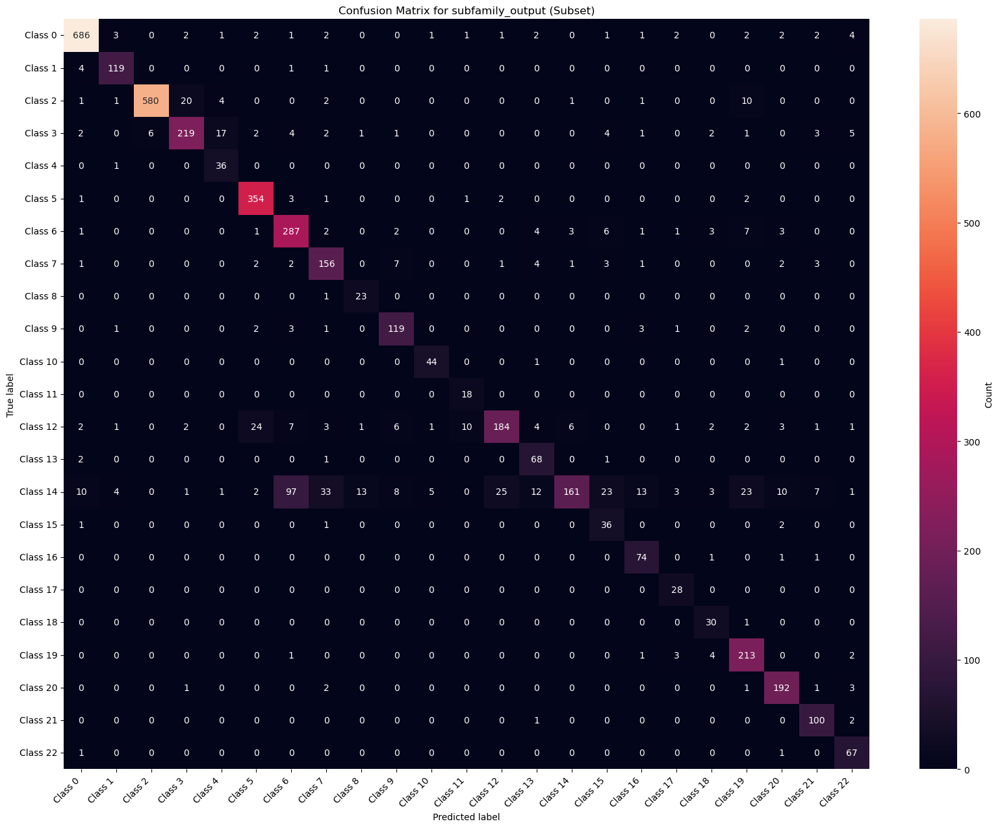

Classification Report for subfamily_output:
              precision    recall  f1-score   support

           0       0.97      0.96      0.97      2674
           1       0.96      0.99      0.98       467
           2       0.99      0.90      0.94      2182
           3       0.88      0.84      0.86      1039
           4       0.56      1.00      0.72       143
           5       0.90      0.97      0.93      1239
           6       0.71      0.91      0.80      1219
           7       0.80      0.82      0.81       794
           8       0.71      1.00      0.83       106
           9       0.86      0.94      0.90       544
          10       0.87      1.00      0.93       144
          11       0.59      1.00      0.74        47
          12       0.88      0.75      0.81      1003
          13       0.72      1.00      0.83       245
          14       0.95      0.35      0.51      1664
          15       0.58      0.99      0.73       158
          16       0.79      1.00    

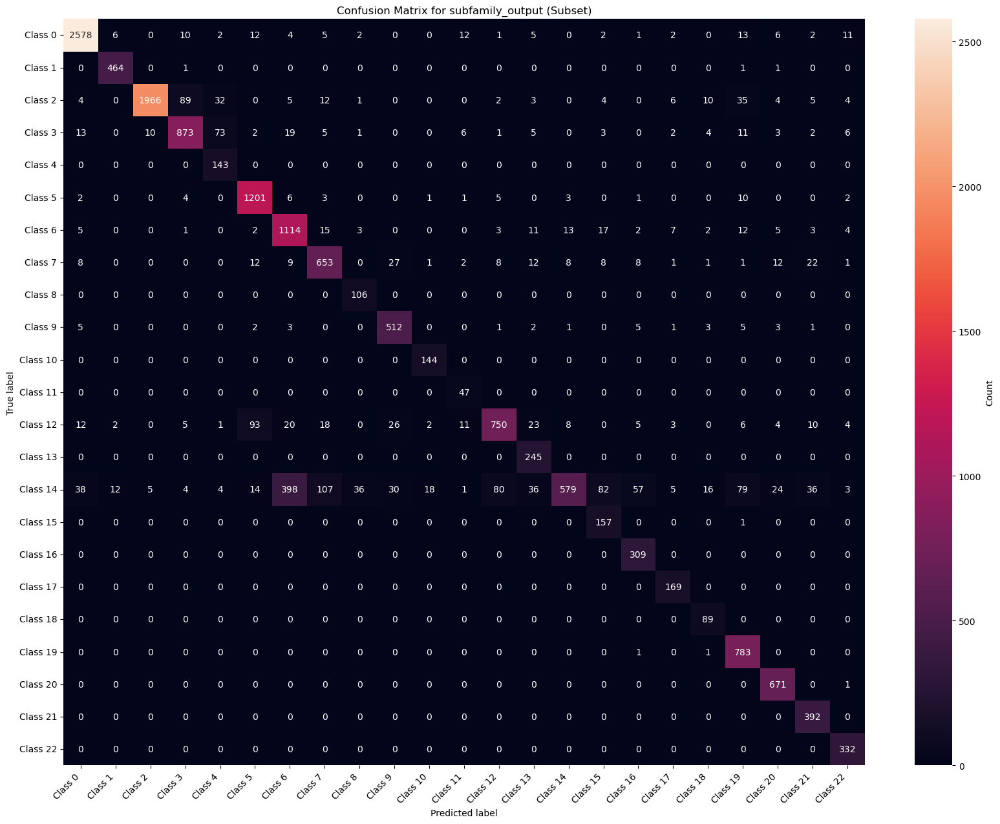

Classification Report for family_output:
              precision    recall  f1-score   support

           0       0.96      0.93      0.95       840
           1       0.98      0.93      0.95       926
           2       0.96      0.92      0.94      1915
           3       0.77      0.98      0.86       361
           4       0.87      0.98      0.92       374

    accuracy                           0.94      4416
   macro avg       0.91      0.95      0.92      4416
weighted avg       0.94      0.94      0.94      4416



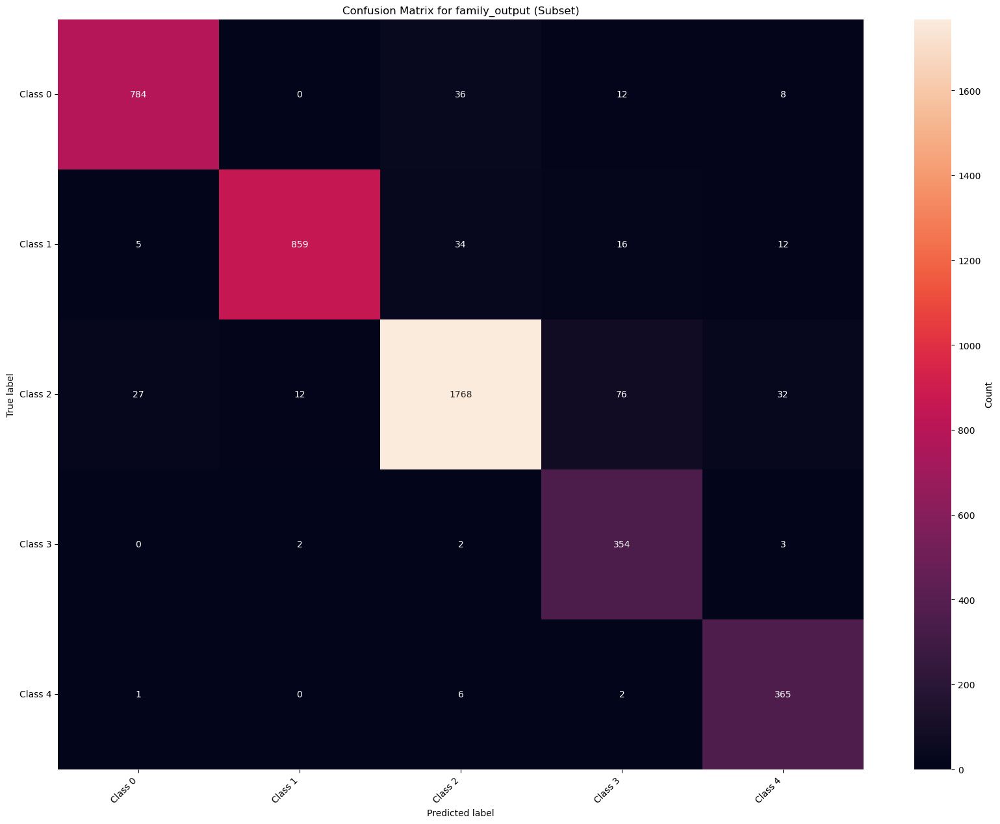

Classification Report for family_output:
              precision    recall  f1-score   support

           0       0.97      0.96      0.96      3143
           1       0.98      0.93      0.95      3366
           2       0.97      0.93      0.95      7161
           3       0.79      1.00      0.88      1351
           4       0.89      1.00      0.94      1395

    accuracy                           0.95     16416
   macro avg       0.92      0.96      0.94     16416
weighted avg       0.95      0.95      0.95     16416



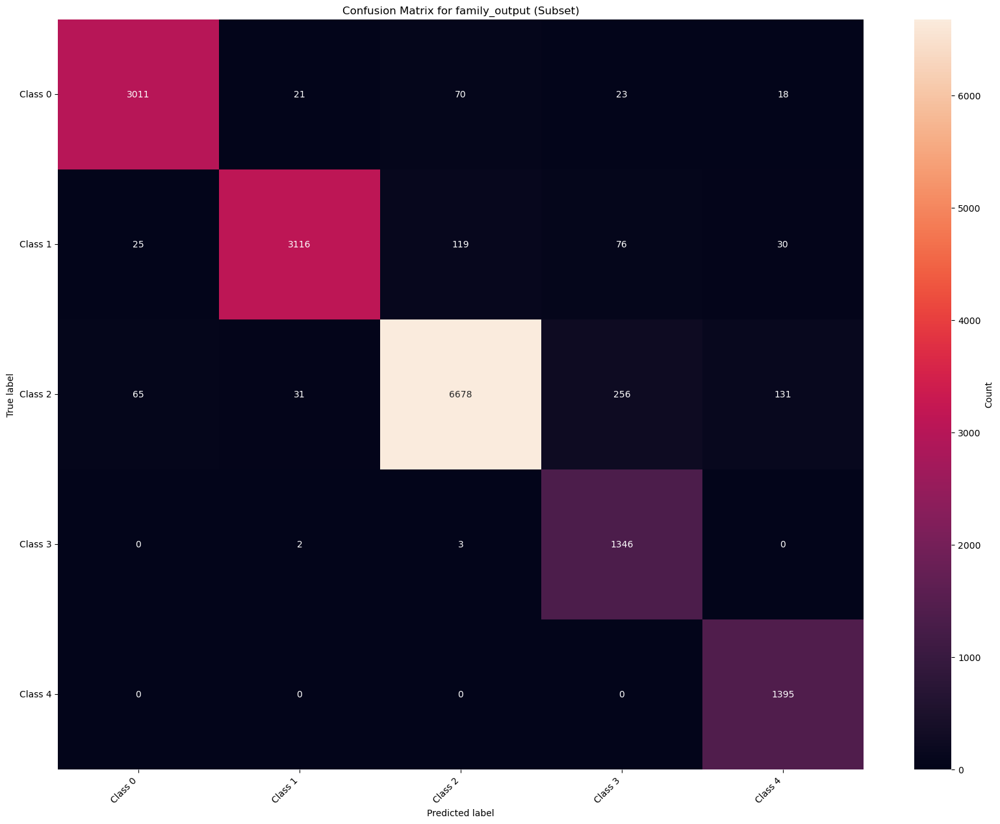

In [16]:
import os
import tensorflow as tf
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Suppress TensorFlow warnings and info messages
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # Suppress all messages
tf.get_logger().setLevel('ERROR')

def plot_confusion_matrix(y_true, y_pred, classes, title):
    cm = confusion_matrix(y_true, y_pred)
    if len(classes) > 25:
        classes = classes[:25]  # Display only first 25 classes if there are more than 25
        cm = cm[:25, :25]  # Confine confusion matrix to first 25 classes
    plt.figure(figsize=(20, 15))
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=classes, yticklabels=classes, cbar_kws={'label': 'Count'})
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.show()

def evaluate_model(model, dataset, output_name, num_classes, subset=25):
    y_true = []
    y_pred = []
    
    for images, labels in dataset:
        preds = model.predict(images, verbose=0)  # Suppress output
        output_index = ['species_output', 'genus_output', 'subfamily_output', 'family_output'].index(output_name)
        true_labels = labels[output_name].numpy()
        predicted_labels = np.argmax(preds[output_index], axis=1)
        
        y_true.extend(true_labels)
        y_pred.extend(predicted_labels)
    
    print(f"Classification Report for {output_name}:")
    print(classification_report(y_true, y_pred))
    
    classes = [f'Class {i}' for i in range(num_classes)]
    plot_confusion_matrix(y_true, y_pred, classes, f'Confusion Matrix for {output_name} (Subset)')

# Example: Evaluate species_output, genus_output, subfamily_output, family_output
evaluate_model(model_with_cbam, train_dataset, 'species_output', num_classes=200, subset=25)
evaluate_model(model_with_cbam, test_dataset, 'species_output', num_classes=200, subset=25)

evaluate_model(model_with_cbam, test_dataset, 'genus_output', num_classes=116, subset=25)
evaluate_model(model_with_cbam, train_dataset, 'genus_output', num_classes=116, subset=25)

evaluate_model(model_with_cbam, test_dataset, 'subfamily_output', num_classes=23, subset=23)
evaluate_model(model_with_cbam, train_dataset, 'subfamily_output', num_classes=23, subset=23)

evaluate_model(model_with_cbam, test_dataset, 'family_output', num_classes=5, subset=5)
evaluate_model(model_with_cbam, train_dataset, 'family_output', num_classes=5, subset=5)



1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 675ms/step


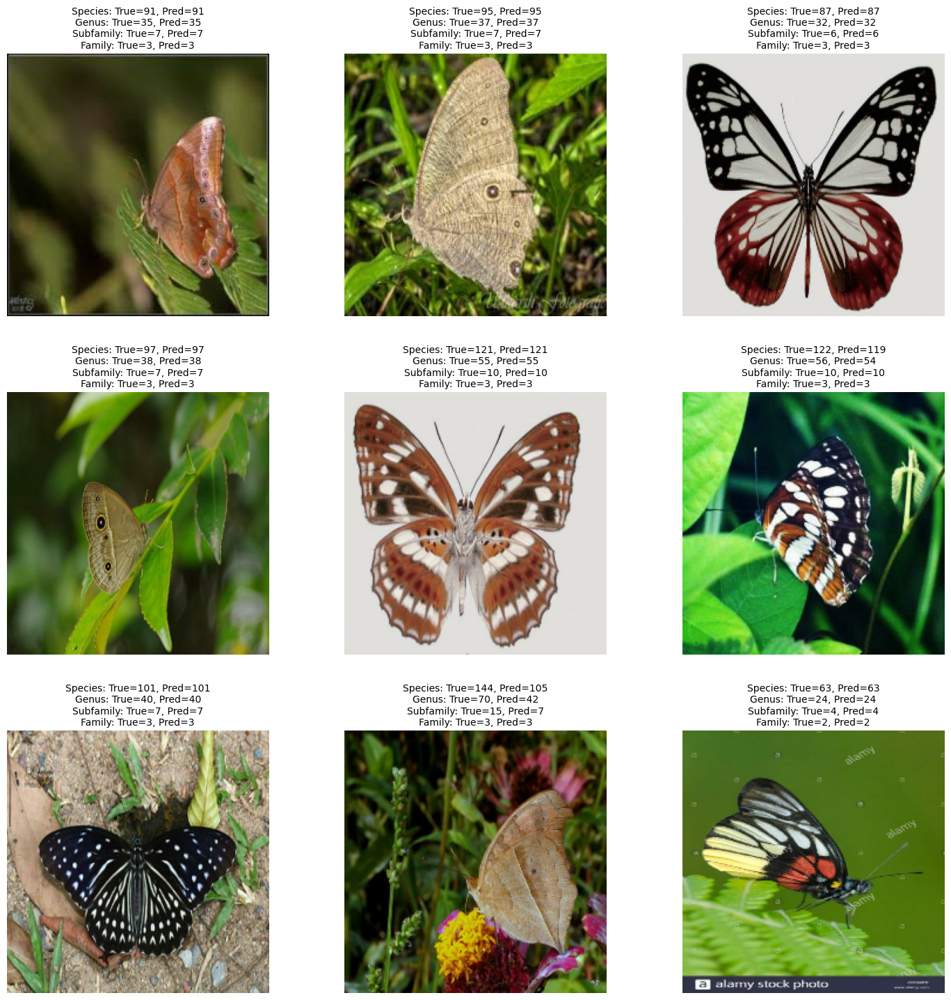

In [17]:
import numpy as np
import matplotlib.pyplot as plt

def visualize_predictions(model, dataset):
    plt.figure(figsize=(15, 15))
    
    for images, labels in dataset.take(1):
        preds = model.predict(images)
        
        true_species = labels['species_output'].numpy() + 1
        true_genus = labels['genus_output'].numpy() + 1
        true_subfamily = labels['subfamily_output'].numpy() + 1
        true_family = labels['family_output'].numpy() + 1
        
        pred_species = np.argmax(preds[0], axis=1) + 1
        pred_genus = np.argmax(preds[1], axis=1) + 1
        pred_subfamily = np.argmax(preds[2], axis=1) + 1
        pred_family = np.argmax(preds[3], axis=1) + 1
        
        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].numpy())
            plt.title(
                f"Species: True={true_species[i]}, Pred={pred_species[i]}\n"
                f"Genus: True={true_genus[i]}, Pred={pred_genus[i]}\n"
                f"Subfamily: True={true_subfamily[i]}, Pred={pred_subfamily[i]}\n"
                f"Family: True={true_family[i]}, Pred={pred_family[i]}",
                fontsize=10
            )
            plt.axis("off")
    
    plt.tight_layout(pad=3.0)
    plt.show()

visualize_predictions(model_with_cbam, test_dataset)


In [18]:
import numpy as np
import tensorflow as tf


# Function to calculate top-n accuracy
def top_n_accuracy(y_true, y_pred_probs, n=1):
    top_n_preds = np.argsort(y_pred_probs, axis=1)[:, -n:]
    correct = np.any(top_n_preds == y_true.reshape(-1, 1), axis=1)
    return np.mean(correct)

# Load the test dataset (assuming `test_dataset` is already defined)
y_true_species = []
y_true_genus = []
y_true_subfamily = []
y_true_family = []
y_pred_species = []
y_pred_genus = []
y_pred_subfamily = []
y_pred_family = []

for images, labels in test_dataset:
    y_true_species.extend(labels['species_output'].numpy())
    y_true_genus.extend(labels['genus_output'].numpy())
    y_true_subfamily.extend(labels['subfamily_output'].numpy())
    y_true_family.extend(labels['family_output'].numpy())
    
    preds = model_with_cbam.predict(images)
    y_pred_species.extend(preds[0])
    y_pred_genus.extend(preds[1])
    y_pred_subfamily.extend(preds[2])
    y_pred_family.extend(preds[3])

# Convert lists to numpy arrays
y_true_species = np.array(y_true_species)
y_true_genus = np.array(y_true_genus)
y_true_subfamily = np.array(y_true_subfamily)
y_true_family = np.array(y_true_family)
y_pred_species = np.array(y_pred_species)
y_pred_genus = np.array(y_pred_genus)
y_pred_subfamily = np.array(y_pred_subfamily)
y_pred_family = np.array(y_pred_family)

# Calculate top-1 and top-5 accuracies for each output
species_top_1_acc = top_n_accuracy(y_true_species, y_pred_species, n=1)
species_top_5_acc = top_n_accuracy(y_true_species, y_pred_species, n=5)
genus_top_1_acc = top_n_accuracy(y_true_genus, y_pred_genus, n=1)
genus_top_5_acc = top_n_accuracy(y_true_genus, y_pred_genus, n=5)
subfamily_top_1_acc = top_n_accuracy(y_true_subfamily, y_pred_subfamily, n=1)
subfamily_top_5_acc = top_n_accuracy(y_true_subfamily, y_pred_subfamily, n=5)
family_top_1_acc = top_n_accuracy(y_true_family, y_pred_family, n=1)
family_top_5_acc = top_n_accuracy(y_true_family, y_pred_family, n=5)

print(f"Test Species Top-1 Accuracy: {species_top_1_acc:.4f}")
print(f"Test Species Top-5 Accuracy: {species_top_5_acc:.4f}")
print(f"Test Genus Top-1 Accuracy: {genus_top_1_acc:.4f}")
print(f"Test Genus Top-5 Accuracy: {genus_top_5_acc:.4f}")
print(f"Test Subfamily Top-1 Accuracy: {subfamily_top_1_acc:.4f}")
print(f"Test Subfamily Top-5 Accuracy: {subfamily_top_5_acc:.4f}")
print(f"Test Family Top-1 Accuracy: {family_top_1_acc:.4f}")
print(f"Test Family Top-5 Accuracy: {family_top_5_acc:.4f}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 687ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 677ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 758ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 681ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 763ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 683ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 678ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 690ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 680ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 763ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 685ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 698ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 678ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 765ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 680ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 763ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 681ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 763ms/step


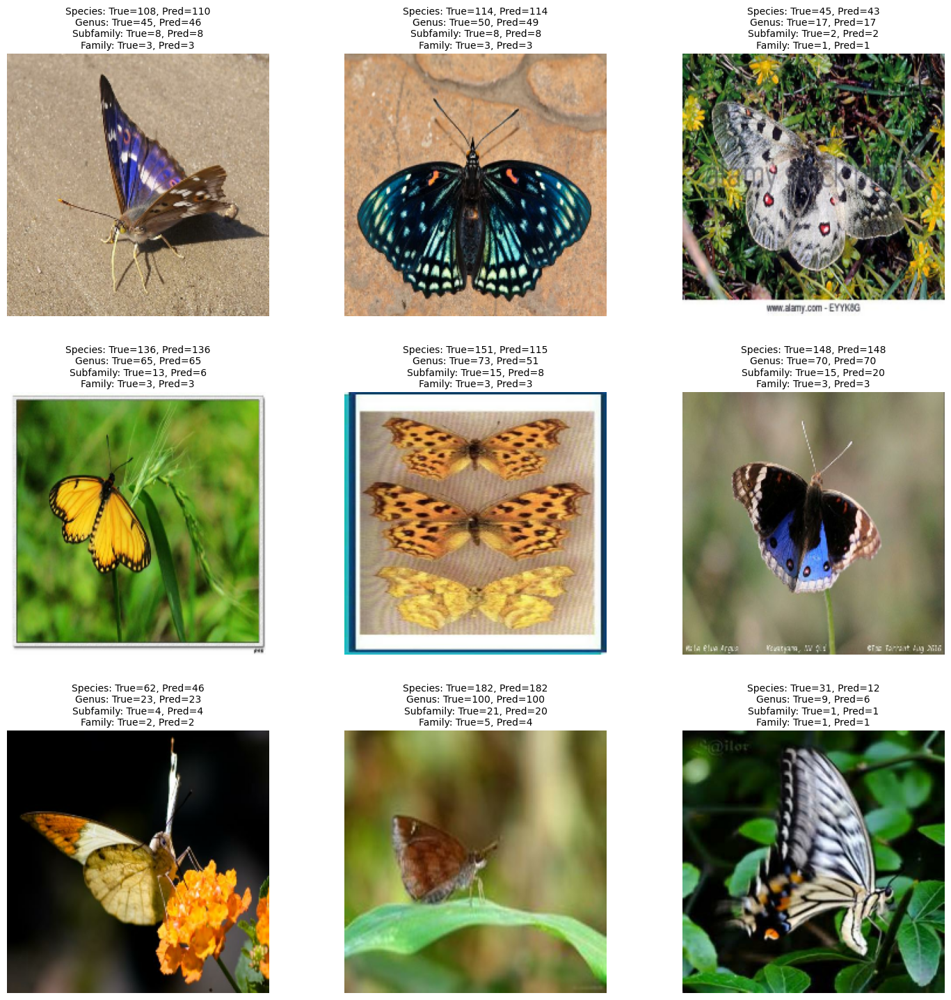

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

def collect_misclassified_examples(model, dataset, num_examples=9):
    misclassified_images = []
    
    for images, labels in dataset:
        preds = model.predict(images)
        true_species = labels['species_output'].numpy()
        true_genus = labels['genus_output'].numpy()
        true_subfamily = labels['subfamily_output'].numpy()
        true_family = labels['family_output'].numpy()
        
        pred_species = np.argmax(preds[0], axis=1)
        pred_genus = np.argmax(preds[1], axis=1)
        pred_subfamily = np.argmax(preds[2], axis=1)
        pred_family = np.argmax(preds[3], axis=1)
        
        # Adjust indices to be 1-based
        true_species += 1
        true_genus += 1
        true_subfamily += 1
        true_family += 1

        pred_species += 1
        pred_genus += 1
        pred_subfamily += 1
        pred_family += 1
        
        # Identify misclassified examples
        for i in range(len(images)):
            if (true_species[i] != pred_species[i] or 
                true_genus[i] != pred_genus[i] or 
                true_subfamily[i] != pred_subfamily[i] or 
                true_family[i] != pred_family[i]):
                if len(misclassified_images) < num_examples:
                    misclassified_images.append((
                        images[i].numpy(), 
                        (true_species[i], pred_species[i]), 
                        (true_genus[i], pred_genus[i]), 
                        (true_subfamily[i], pred_subfamily[i]), 
                        (true_family[i], pred_family[i])
                    ))
                else:
                    break
        
        if len(misclassified_images) >= num_examples:
            break

    return misclassified_images

def plot_misclassified_examples(misclassified_images):
    plt.figure(figsize=(15, 15))
    for i, (image, species, genus, subfamily, family) in enumerate(misclassified_images):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(image)
        plt.title(
            f"Species: True={species[0]}, Pred={species[1]}\n"
            f"Genus: True={genus[0]}, Pred={genus[1]}\n"
            f"Subfamily: True={subfamily[0]}, Pred={subfamily[1]}\n"
            f"Family: True={family[0]}, Pred={family[1]}",
            fontsize=10
        )
        plt.axis("off")
    plt.tight_layout(pad=3.0)
    plt.show()

# Collect and plot misclassified examples for the dataset
misclassified_examples = collect_misclassified_examples(model_with_cbam, test_dataset)
plot_misclassified_examples(misclassified_examples)
